# Data Science 410 BB
## University of Washington Professional & Continuing Education

### Homework 2: Exploring Multivariate Data
### Leo Salemann
### 1/18/18


# Abstract

The heating load of buildings depends on ... Evidence for this relationship can be seen by ... in the figure and by noting .... in the table above.

# Appendix

## Load and examine the data set

In [1]:
read.housing = function(file = 'kc_house_data.csv'){
  ## Read the csv file
  kc.housing <- read.csv(file, header = TRUE, 
                      stringsAsFactors = FALSE)

 
  ## Remove cases or rows with missing values. In this case we keep the 
  ## rows which do not have nas. 
  # bldg.energy[complete.cases(bldg.energy), ]
}

kc.housing = read.housing()

In [2]:
str(kc.housing)

'data.frame':	21613 obs. of  21 variables:
 $ id           : num  7.13e+09 6.41e+09 5.63e+09 2.49e+09 1.95e+09 ...
 $ date         : chr  "20141013T000000" "20141209T000000" "20150225T000000" "20141209T000000" ...
 $ price        : num  221900 538000 180000 604000 510000 ...
 $ bedrooms     : int  3 3 2 4 3 4 3 3 3 3 ...
 $ bathrooms    : num  1 2.25 1 3 2 4.5 2.25 1.5 1 2.5 ...
 $ sqft_living  : int  1180 2570 770 1960 1680 5420 1715 1060 1780 1890 ...
 $ sqft_lot     : int  5650 7242 10000 5000 8080 101930 6819 9711 7470 6560 ...
 $ floors       : num  1 2 1 1 1 1 2 1 1 2 ...
 $ waterfront   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ view         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ condition    : int  3 3 3 5 3 3 3 3 3 3 ...
 $ grade        : int  7 7 6 7 8 11 7 7 7 7 ...
 $ sqft_above   : int  1180 2170 770 1050 1680 3890 1715 1060 1050 1890 ...
 $ sqft_basement: int  0 400 0 910 0 1530 0 0 730 0 ...
 $ yr_built     : int  1955 1951 1933 1965 1987 2001 1995 1963 1960 2003 ...
 $ yr_renovated :

Okay, we've got 21,613 observations at 21 variables each. Dates are encoded (strings), the rest looks pretty clean.

In [9]:
names(kc.housing)

[1] "id"            "date"          "price"         "bedrooms"     
 [5] "bathrooms"     "sqft_living"   "sqft_lot"      "floors"       
 [9] "waterfront"    "view"          "condition"     "grade"        
[13] "sqft_above"    "sqft_basement" "yr_built"      "yr_renovated" 
[17] "zipcode"       "lat"           "long"          "sqft_living15"
[21] "sqft_lot15"

In [ ]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ Relative.Compactness + Surface.Area +
                  Wall.Area + Roof.Area + Overall.Height +
                  Orientation + Glazing.Area + 
                  Glazing.Area.Distribution + Heating.Load + 
                  Cooling.Load, data = kc.housing)

## Start by Looking at Everything

In [11]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + 
                  view + condition + grade + sqft_above + sqft_basement + yr_built + yr_renovated + zipcode + 
                  lat + long + sqft_living15 + sqft_lot15, data = kc.housing)

In [11]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + bedrooms 
                  + bathrooms 
                  + floors 
                  
                  + waterfront 
                  + view 
                  + condition 
                  + grade 

                  + yr_built 
                  + yr_renovated                   
                  + zipcode 
                  + lat 
                  + long 
                  
                  + sqft_living 
                  + sqft_lot 
                  + sqft_above 
                  
                  + sqft_basement 
                  + sqft_living15 
                  + sqft_lot15
                  
                  , data = kc.housing)

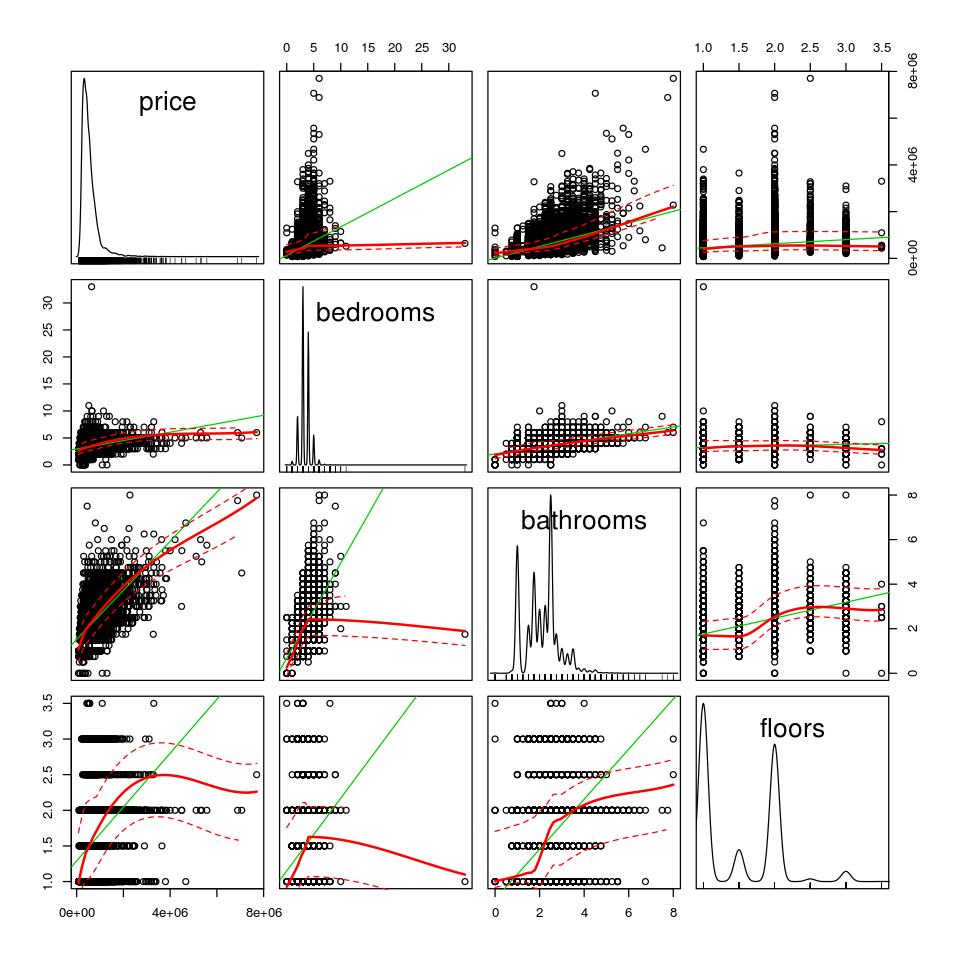

In [28]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + bedrooms 
                  + bathrooms 
                  + floors 
                  
                  , data = kc.housing)

Multiple categorical values, let's do some frequency "sweeps"

In [67]:
table(kc.housing$floors)


    1   1.5     2   2.5     3   3.5 
10680  1910  8241   161   613     8 

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

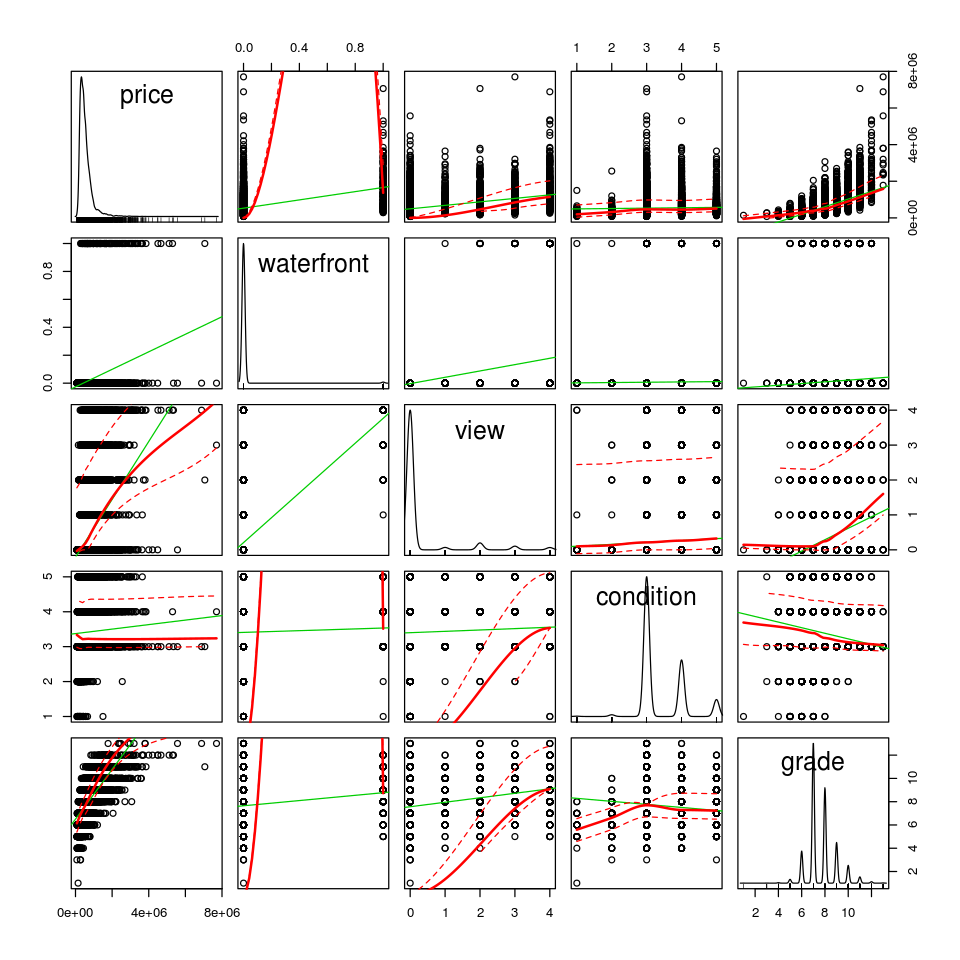

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                                    
                  + waterfront 
                  + view 
                  + condition 
                  + grade 
                  
                  , data = kc.housing)

In [68]:
table(kc.housing$grade)


   1    3    4    5    6    7    8    9   10   11   12   13 
   1    3   29  242 2038 8981 6068 2615 1134  399   90   13 

In [69]:
table(kc.housing$condition)


    1     2     3     4     5 
   30   172 14031  5679  1701 

In [70]:
table(kc.housing$view)


    0     1     2     3     4 
19489   332   963   510   319 

In [71]:
table(kc.housing$waterfront)


    0     1 
21450   163 

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

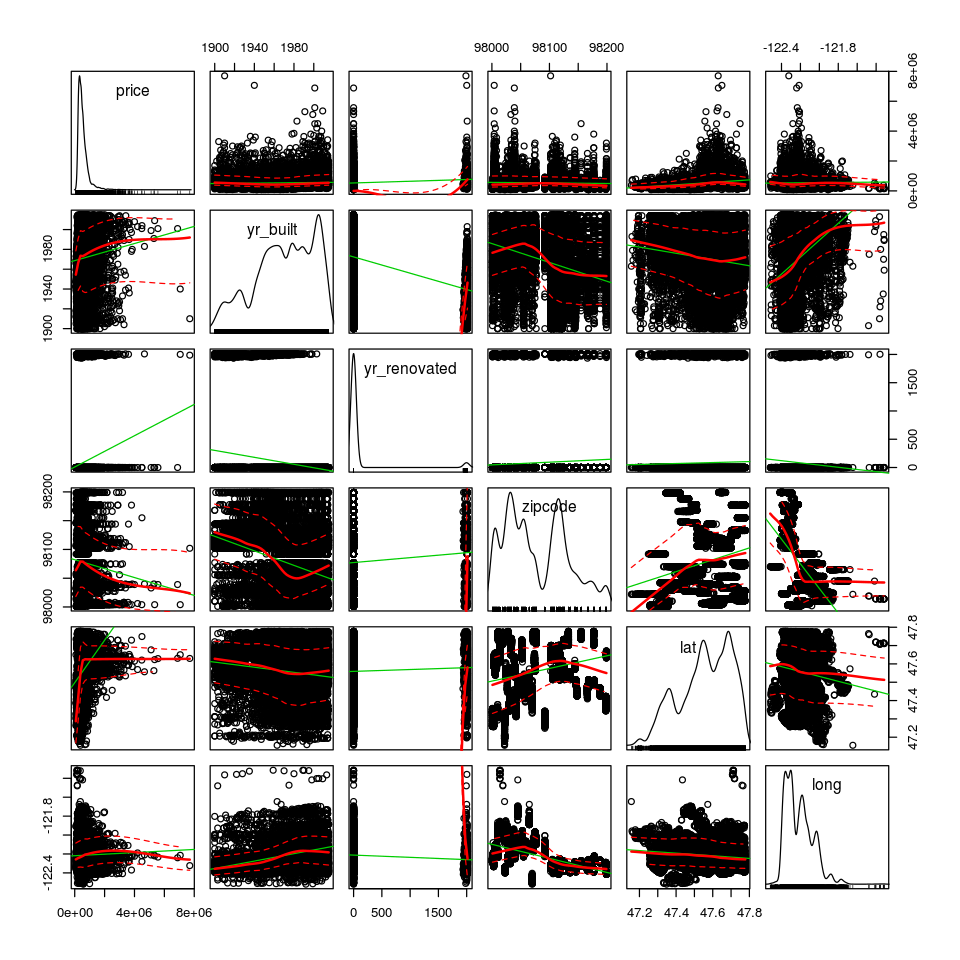

In [30]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + yr_built 
                  + yr_renovated                   
                  + zipcode 
                  + lat 
                  + long 
                  
                  , data = kc.housing)

In [72]:
table(kc.housing$yr_renovated)


    0  1934  1940  1944  1945  1946  1948  1950  1951  1953  1954  1955  1956 
20699     1     2     1     3     2     1     2     1     3     1     3     3 
 1957  1958  1959  1960  1962  1963  1964  1965  1967  1968  1969  1970  1971 
    3     5     1     4     2     4     5     5     2     8     4     9     2 
 1972  1973  1974  1975  1976  1977  1978  1979  1980  1981  1982  1983  1984 
    4     5     3     6     3     8     6    10    11     5    11    18    18 
 1985  1986  1987  1988  1989  1990  1991  1992  1993  1994  1995  1996  1997 
   17    17    18    15    22    25    20    17    19    19    16    15    15 
 1998  1999  2000  2001  2002  2003  2004  2005  2006  2007  2008  2009  2010 
   19    17    35    19    22    36    26    35    24    35    18    22    18 
 2011  2012  2013  2014  2015 
   13    11    37    91    16 

In [73]:
table(kc.housing$zipcode)


98001 98002 98003 98004 98005 98006 98007 98008 98010 98011 98014 98019 98022 
  362   199   280   317   168   498   141   283   100   195   124   190   234 
98023 98024 98027 98028 98029 98030 98031 98032 98033 98034 98038 98039 98040 
  499    81   412   283   321   256   274   125   432   545   590    50   282 
98042 98045 98052 98053 98055 98056 98058 98059 98065 98070 98072 98074 98075 
  548   221   574   405   268   406   455   468   310   118   273   441   359 
98077 98092 98102 98103 98105 98106 98107 98108 98109 98112 98115 98116 98117 
  198   351   105   602   229   335   266   186   109   269   583   330   553 
98118 98119 98122 98125 98126 98133 98136 98144 98146 98148 98155 98166 98168 
  508   184   290   410   354   494   263   343   288    57   446   254   269 
98177 98178 98188 98198 98199 
  255   262   136   280   317 

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

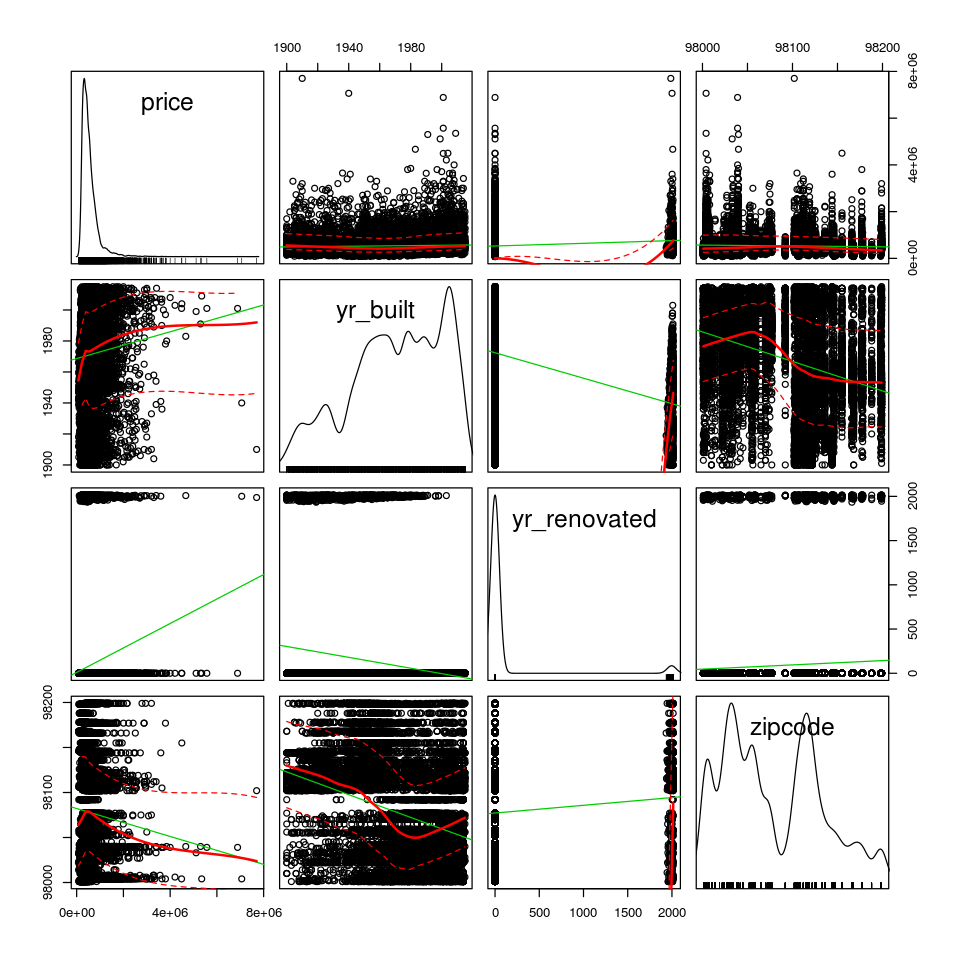

In [33]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + yr_built 
                  + yr_renovated                   
                  + zipcode 
                  
                  , data = kc.housing)

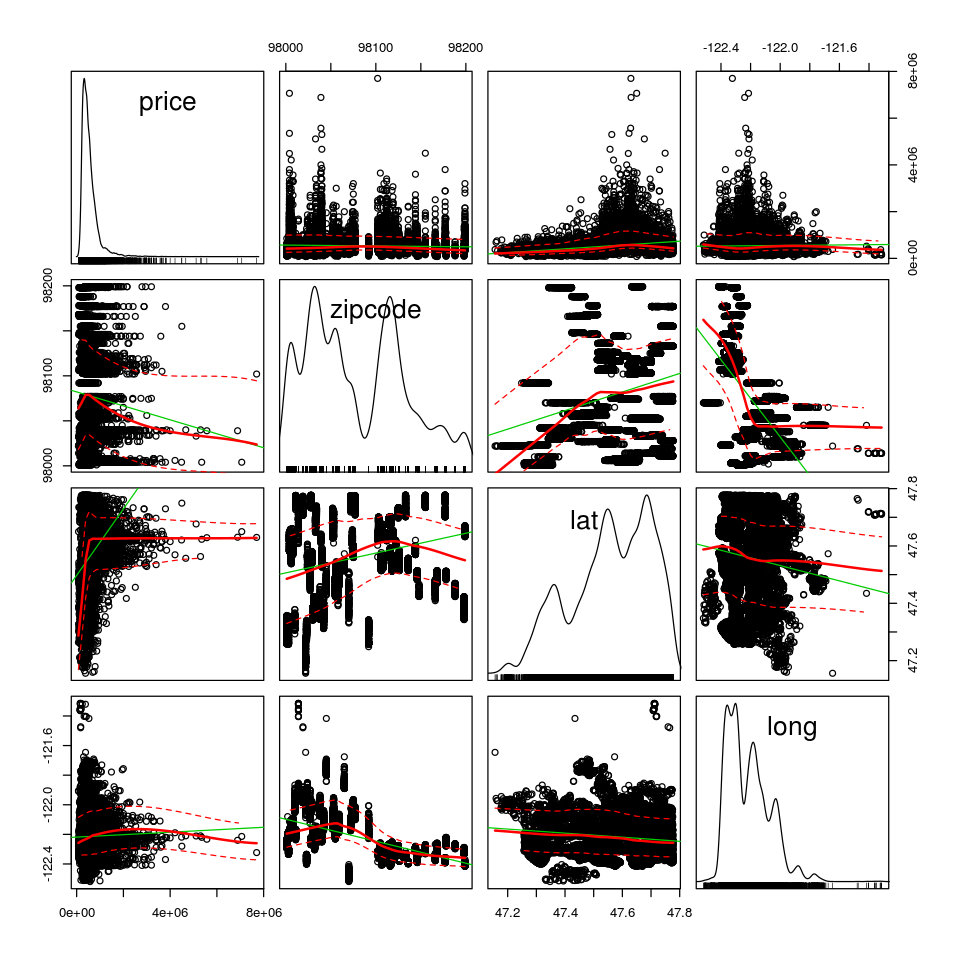

In [34]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                                     
                  + zipcode 
                  + lat 
                  + long 
                  
                  , data = kc.housing)

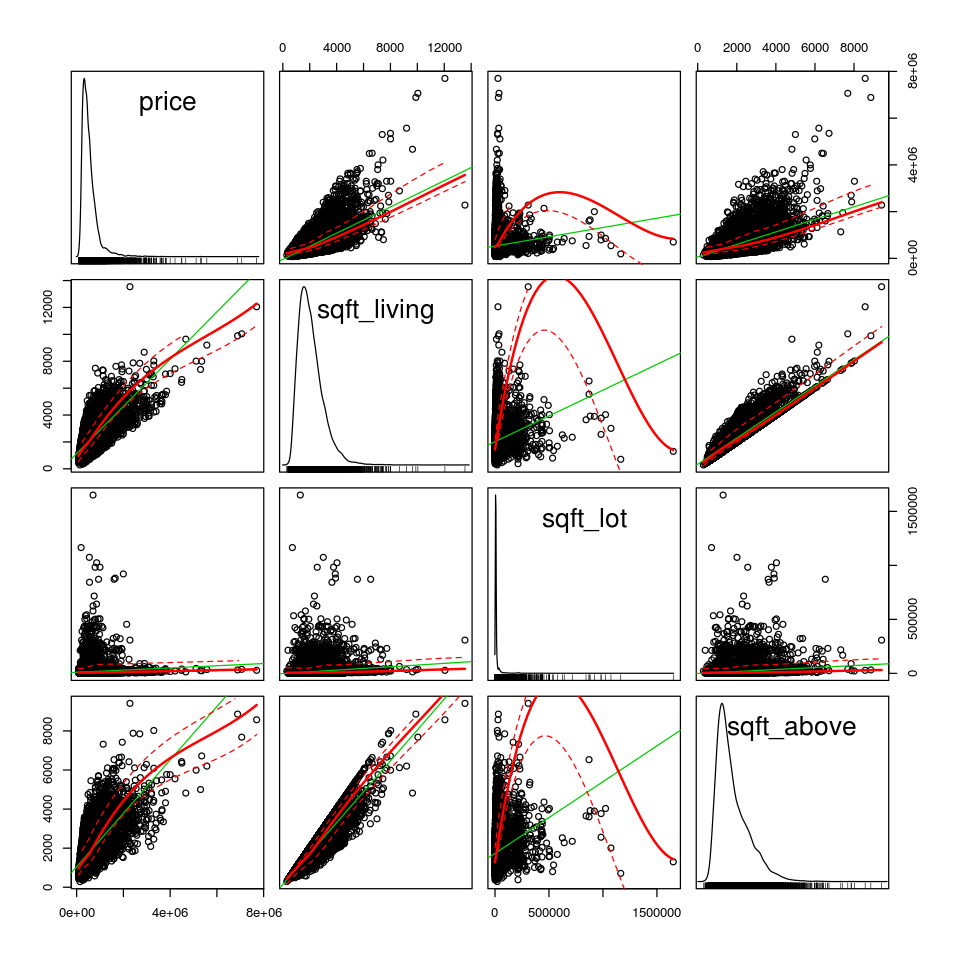

In [31]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + sqft_living 
                  + sqft_lot 
                  + sqft_above 
                  
                  , data = kc.housing)

In [65]:
table(kc.housing$zipcode)


98001 98002 98003 98004 98005 98006 98007 98008 98010 98011 98014 98019 98022 
  362   199   280   317   168   498   141   283   100   195   124   190   234 
98023 98024 98027 98028 98029 98030 98031 98032 98033 98034 98038 98039 98040 
  499    81   412   283   321   256   274   125   432   545   590    50   282 
98042 98045 98052 98053 98055 98056 98058 98059 98065 98070 98072 98074 98075 
  548   221   574   405   268   406   455   468   310   118   273   441   359 
98077 98092 98102 98103 98105 98106 98107 98108 98109 98112 98115 98116 98117 
  198   351   105   602   229   335   266   186   109   269   583   330   553 
98118 98119 98122 98125 98126 98133 98136 98144 98146 98148 98155 98166 98168 
  508   184   290   410   354   494   263   343   288    57   446   254   269 
98177 98178 98188 98198 98199 
  255   262   136   280   317 

Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimpl

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

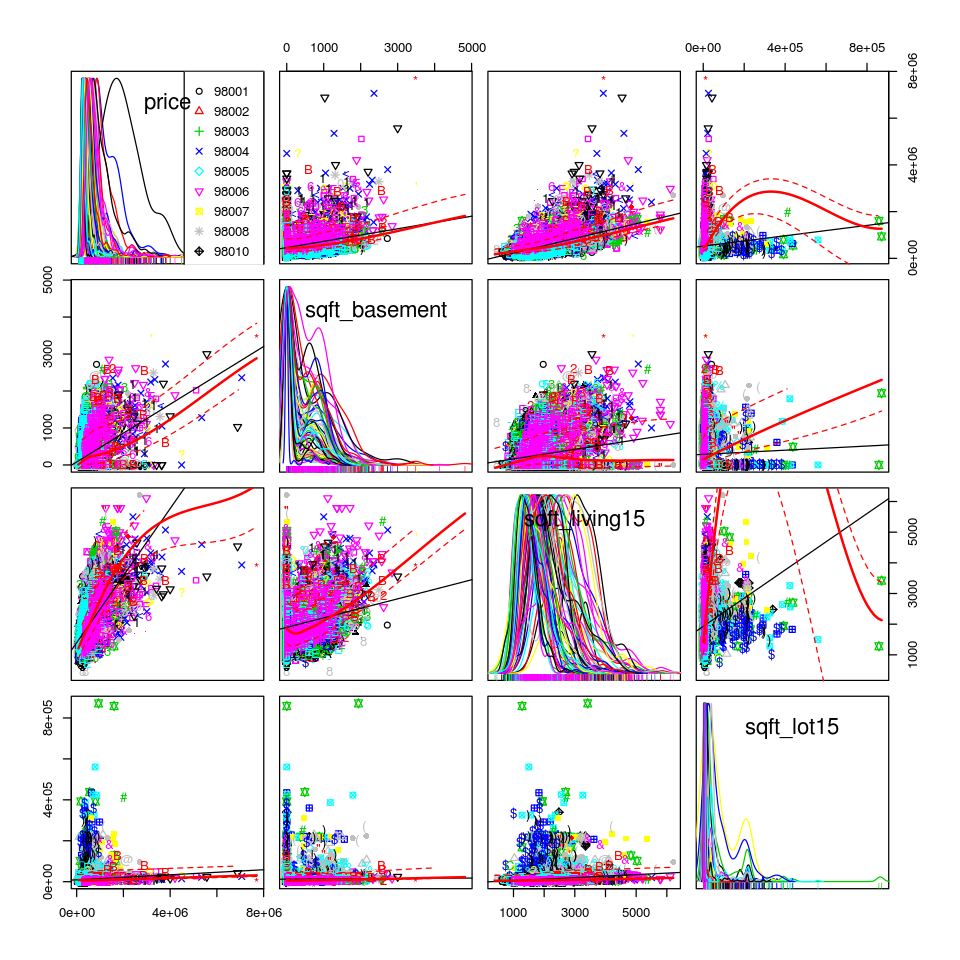

In [66]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                   
                  + sqft_basement 
                  + sqft_living15 
                  + sqft_lot15
                  | factor(zipcode)
                  
                  , data = kc.housing)

In [ ]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + bedrooms + bathrooms + sqft_living,
                  data = kc.housing)

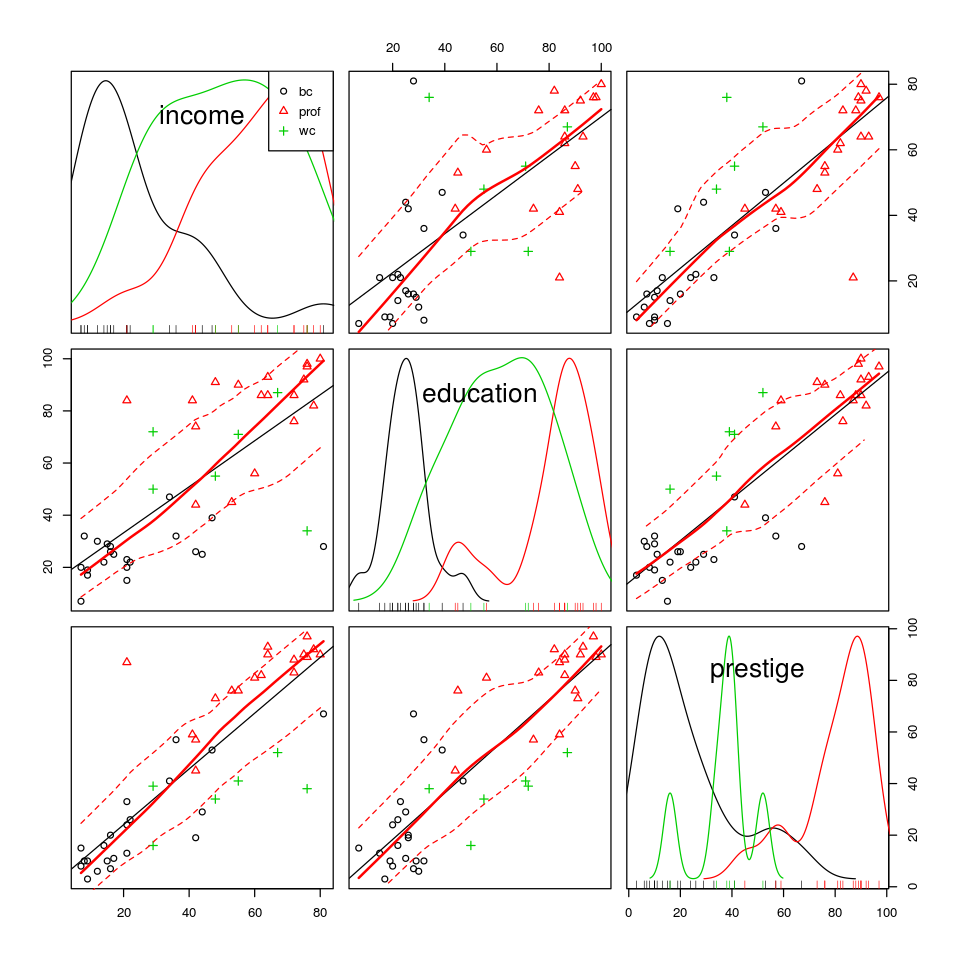

In [47]:
require(car)
scatterplotMatrix(~ income + education + prestige | type, data=Duncan)

In [52]:
str(Duncan)

'data.frame':	45 obs. of  4 variables:
 $ type     : Factor w/ 3 levels "bc","prof","wc": 2 2 2 2 2 2 2 2 3 2 ...
 $ income   : int  62 72 75 55 64 21 64 80 67 72 ...
 $ education: int  86 76 92 90 86 84 93 100 87 86 ...
 $ prestige : int  82 83 90 76 90 87 93 90 52 88 ...


In [61]:
table(Duncan$education)


  7  15  17  19  20  22  23  25  26  28  29  30  32  34  39  44  45  47  50  55 
  1   1   1   1   2   2   1   2   2   2   1   1   2   1   1   1   1   1   1   1 
 56  71  72  74  76  82  84  86  87  90  91  92  93  97  98 100 
  1   1   1   1   1   1   2   3   1   1   1   1   1   1   1   1 

Warning message in diag.panel(...):
“cannot estimate density for group 8
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 12
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 14
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 15
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 17
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”W

”Warning message in diag.panel(...):
“cannot estimate density for group 67
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 75
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 78
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 80
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 81
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically



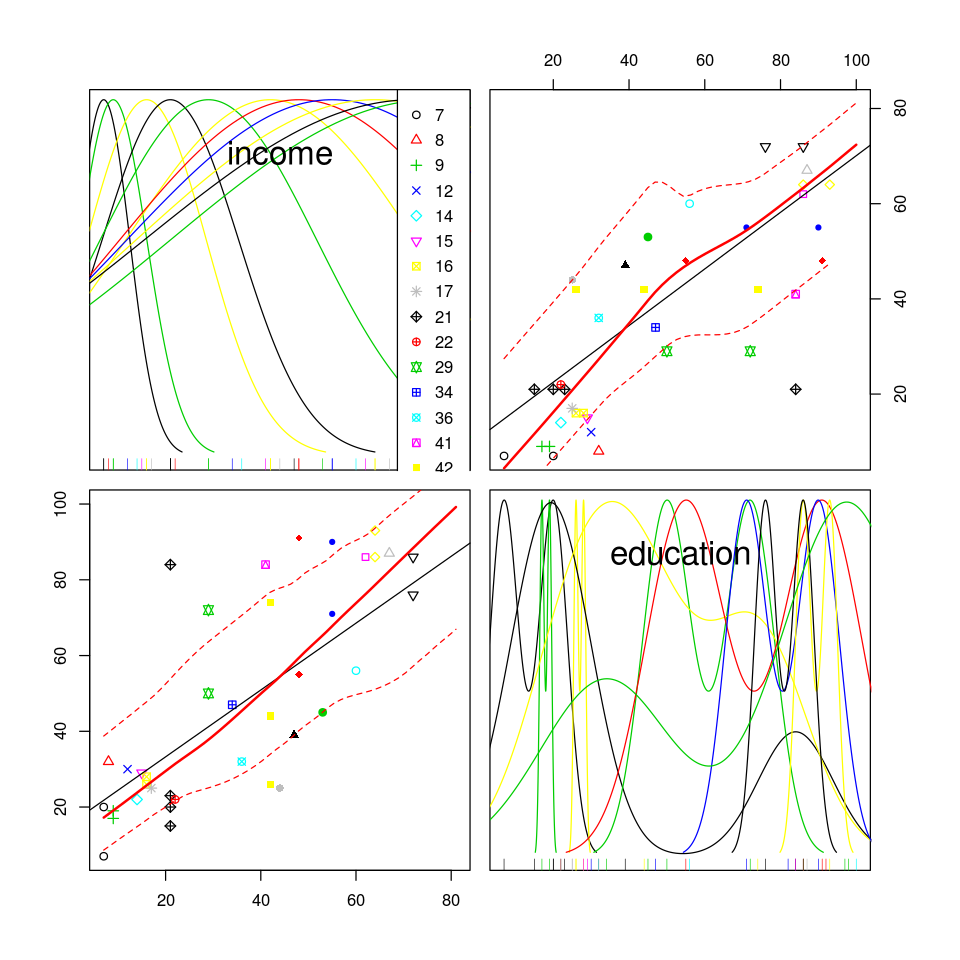

In [56]:
require(car)
scatterplotMatrix(~ income + education | factor(income), data=Duncan)

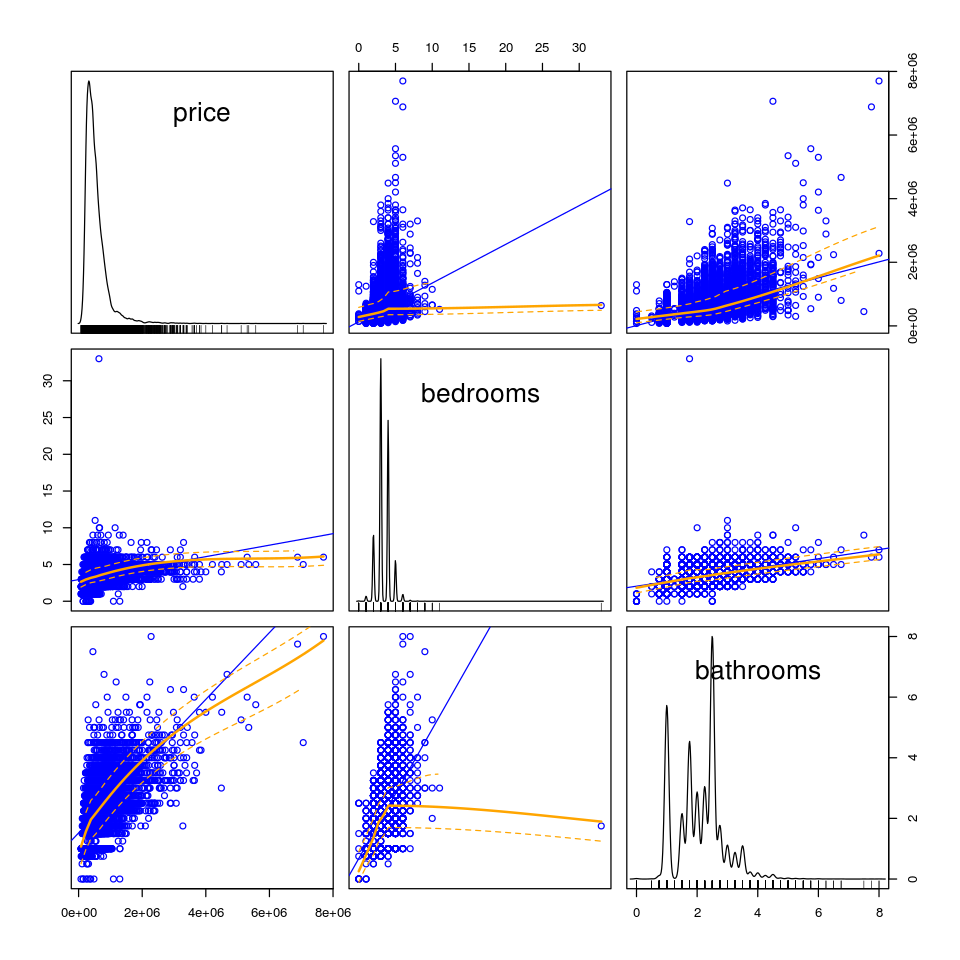

In [44]:
cols2 <- character(nrow(kc.housing))
cols2[] <- "black"
cols2[kc.housing$yr_renovated < 1990] <- "blue"
cols2[kc.housing$yr_renovated > 1990] <- "orange"

options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + bedrooms + bathrooms|yr_renovated,
                  data = kc.housing, col = cols2)

In [ ]:
par(bg="gray")

# cols2 <- character(nrow(bldg.energy))
# cols2[] <- "black"
# cols2[bldg.interesting$Overall.Height == 3.5] <- "green"
# cols2[bldg.interesting$Overall.Height == 7] <- "yellow"

# pairs(bldg.interesting[,0:4], col=cols2,
#      diag.panel = panel.hist,
#      upper.panel = panel.cor)

pairs(kc.housing[,0:22], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

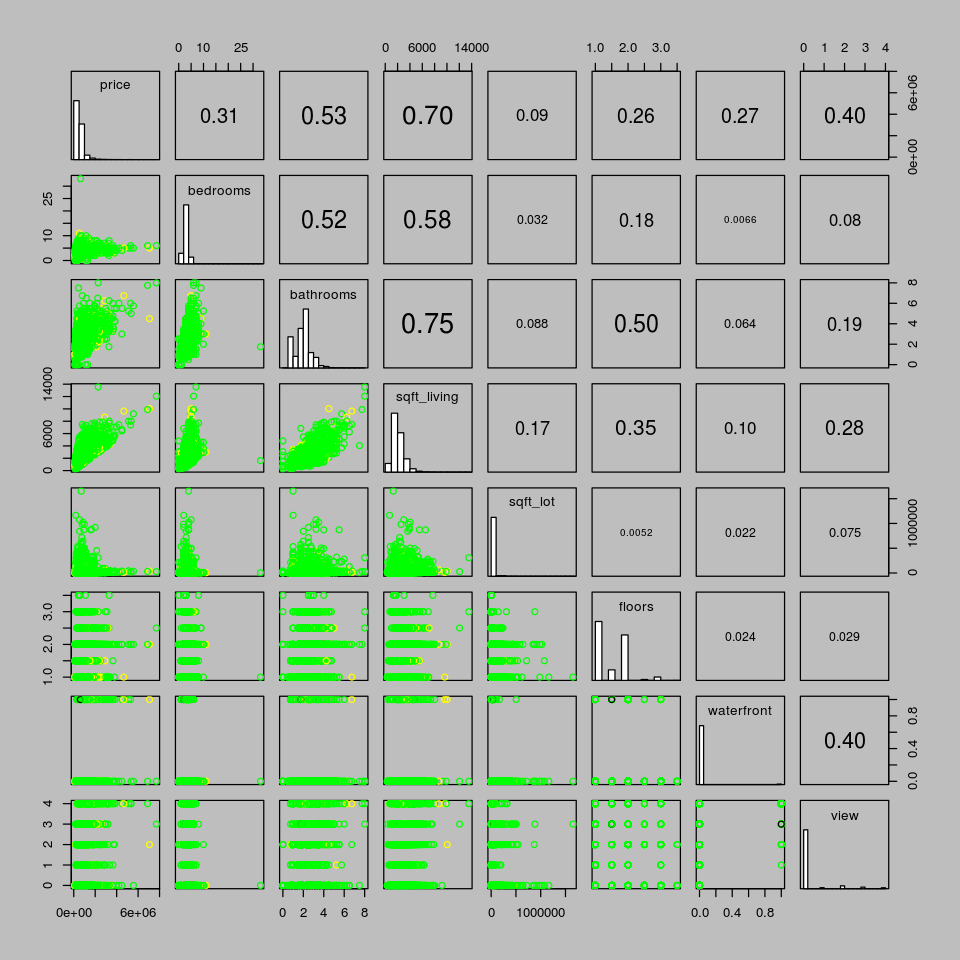

In [42]:
par(bg="gray")

panel.hist = function(x, ...){
  usr = par('usr')
  on.exit(par(usr))
  par(usr = c(usr[1:2], 0, 1.5))
  h = hist(x, plot=FALSE)
  breaks = h$breaks
  nB = length(breaks)
  y=h$counts
  y=y/max(y)
  rect(breaks[-nB], 0, breaks[-1], y, col='white')
}

panel.cor = function(x, y, digits=2, prefix="", cex.cor, ...){
  usr = par("usr")
  on.exit(par(usr))
  par(usr = c(0,1,0,1))
  r = abs(cor(x,y,use='complete.obs'))
  txt=format(c(r,0.123456789),digits=digits)[1]
  txt=paste(prefix,txt,sep='')
  if(missing(cex.cor)) cex.cor = 0.8/strwidth(txt)
  text(0.5, 0.5, txt, cex = cex.cor*(1+r)/2)
}
cols2 <- character(nrow(kc.housing))
cols2[] <- "black"
cols2[kc.housing$yr_renovated < 1990] <- "green"
cols2[kc.housing$yr_renovated > 1990] <- "yellow"

pairs(kc.housing[,3:10], col=cols2,
      diag.panel = panel.hist,
      upper.panel = panel.cor)

# pairs(kc.housing[,3:10], 
#      diag.panel = panel.hist,
#      upper.panel = panel.cor)

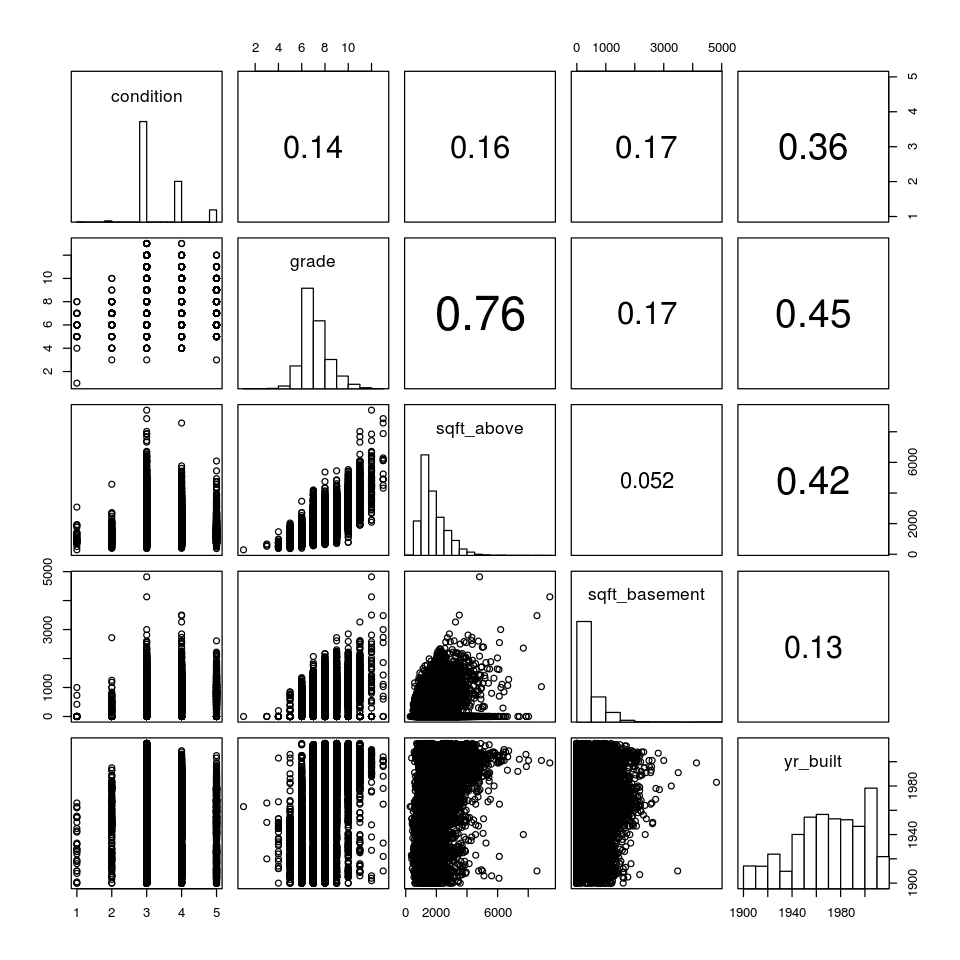

In [20]:
pairs(kc.housing[,11:15], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

In [35]:
str(kc.housing)

'data.frame':	21613 obs. of  21 variables:
 $ id           : num  7.13e+09 6.41e+09 5.63e+09 2.49e+09 1.95e+09 ...
 $ date         : chr  "20141013T000000" "20141209T000000" "20150225T000000" "20141209T000000" ...
 $ price        : num  221900 538000 180000 604000 510000 ...
 $ bedrooms     : int  3 3 2 4 3 4 3 3 3 3 ...
 $ bathrooms    : num  1 2.25 1 3 2 4.5 2.25 1.5 1 2.5 ...
 $ sqft_living  : int  1180 2570 770 1960 1680 5420 1715 1060 1780 1890 ...
 $ sqft_lot     : int  5650 7242 10000 5000 8080 101930 6819 9711 7470 6560 ...
 $ floors       : num  1 2 1 1 1 1 2 1 1 2 ...
 $ waterfront   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ view         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ condition    : int  3 3 3 5 3 3 3 3 3 3 ...
 $ grade        : int  7 7 6 7 8 11 7 7 7 7 ...
 $ sqft_above   : int  1180 2170 770 1050 1680 3890 1715 1060 1050 1890 ...
 $ sqft_basement: int  0 400 0 910 0 1530 0 0 730 0 ...
 $ yr_built     : int  1955 1951 1933 1965 1987 2001 1995 1963 1960 2003 ...
 $ yr_renovated :

In [37]:
table(kc.housing$yr_renovated)


    0  1934  1940  1944  1945  1946  1948  1950  1951  1953  1954  1955  1956 
20699     1     2     1     3     2     1     2     1     3     1     3     3 
 1957  1958  1959  1960  1962  1963  1964  1965  1967  1968  1969  1970  1971 
    3     5     1     4     2     4     5     5     2     8     4     9     2 
 1972  1973  1974  1975  1976  1977  1978  1979  1980  1981  1982  1983  1984 
    4     5     3     6     3     8     6    10    11     5    11    18    18 
 1985  1986  1987  1988  1989  1990  1991  1992  1993  1994  1995  1996  1997 
   17    17    18    15    22    25    20    17    19    19    16    15    15 
 1998  1999  2000  2001  2002  2003  2004  2005  2006  2007  2008  2009  2010 
   19    17    35    19    22    36    26    35    24    35    18    22    18 
 2011  2012  2013  2014  2015 
   13    11    37    91    16 

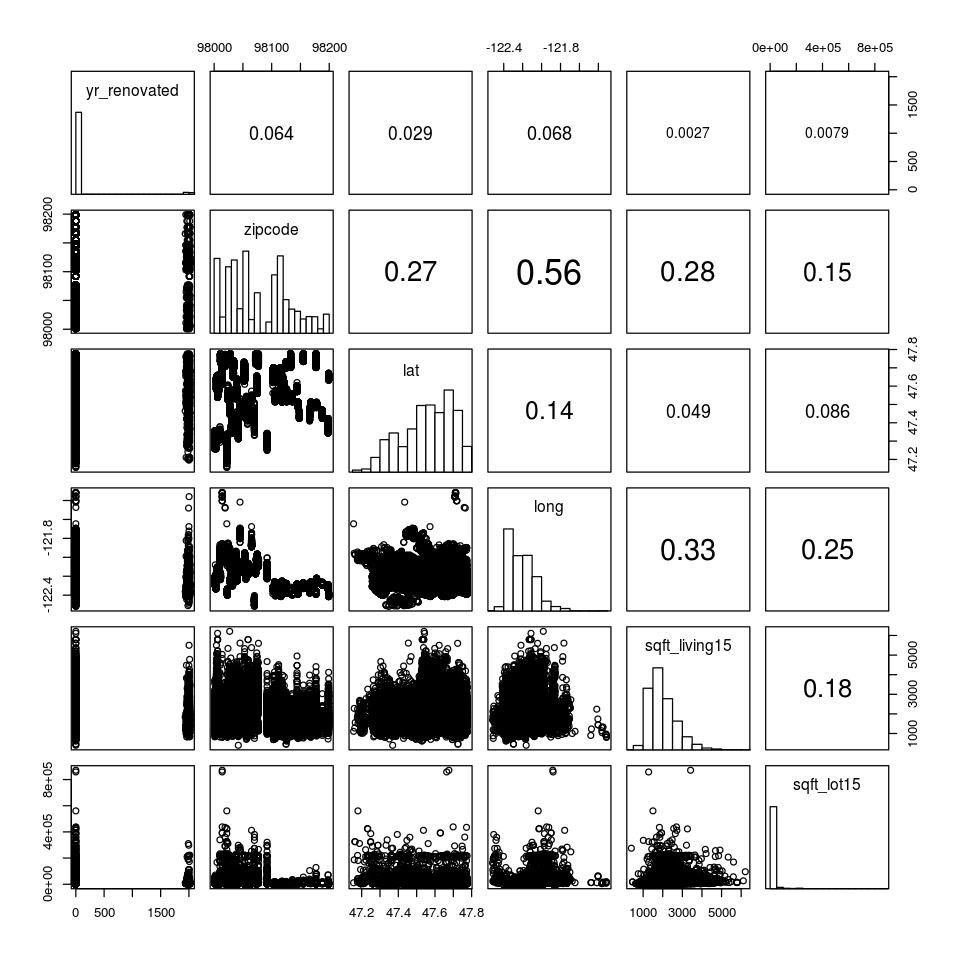

In [21]:
pairs(kc.housing[,16:21], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

# ==================< OLD >======================

## Summary Statistics

In [3]:
summary (kc.housing)

       id                date               price            bedrooms     
 Min.   :1.000e+06   Length:21613       Min.   :  75000   Min.   : 0.000  
 1st Qu.:2.123e+09   Class :character   1st Qu.: 321950   1st Qu.: 3.000  
 Median :3.905e+09   Mode  :character   Median : 450000   Median : 3.000  
 Mean   :4.580e+09                      Mean   : 540088   Mean   : 3.371  
 3rd Qu.:7.309e+09                      3rd Qu.: 645000   3rd Qu.: 4.000  
 Max.   :9.900e+09                      Max.   :7700000   Max.   :33.000  
   bathrooms      sqft_living       sqft_lot           floors     
 Min.   :0.000   Min.   :  290   Min.   :    520   Min.   :1.000  
 1st Qu.:1.750   1st Qu.: 1427   1st Qu.:   5040   1st Qu.:1.000  
 Median :2.250   Median : 1910   Median :   7618   Median :1.500  
 Mean   :2.115   Mean   : 2080   Mean   :  15107   Mean   :1.494  
 3rd Qu.:2.500   3rd Qu.: 2550   3rd Qu.:  10688   3rd Qu.:2.000  
 Max.   :8.000   Max.   :13540   Max.   :1651359   Max.   :3.500  
   wat

Looks like we got lucky; data's pretty clean - no strings in the numerics, min/max seem reasonable. Let's look at standard devations.

In [4]:
lapply(bldg.energy, sd)

$Relative.Compactness
[1] 0.1057775

$Surface.Area
[1] 88.08612

$Wall.Area
[1] 43.62648

$Roof.Area
[1] 45.16595

$Overall.Height
[1] 1.75114

$Orientation
[1] 1.118763

$Glazing.Area
[1] 0.1332206

$Glazing.Area.Distribution
[1] 1.55096

$Heating.Load
[1] 10.0902

$Cooling.Load
[1] 9.513306

Surface/Roof/Wall areas have the most deviation, follwed by Heating and Cooling load. Height, orientation, and Glazing Area are remmarkably similar.  

Let's gather up all the 'compact' variables into one subset

Next up: A quick head/tail check.

In [5]:
bldg.compact = bldg.energy[, c('Relative.Compactness', 
                               'Overall.Height',
                               'Orientation', 'Glazing.Area', 
                               'Glazing.Area.Distribution')]

## Examine data frames

In [6]:
head(bldg.energy)

Relative.Compactness,Surface.Area,Wall.Area,Roof.Area,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution,Heating.Load,Cooling.Load
0.98,514.5,294.0,110.25,7,2,0,0,15.55,21.33
0.98,514.5,294.0,110.25,7,3,0,0,15.55,21.33
0.98,514.5,294.0,110.25,7,4,0,0,15.55,21.33
0.98,514.5,294.0,110.25,7,5,0,0,15.55,21.33
0.90,563.5,318.5,122.50,7,2,0,0,20.84,28.28
0.90,563.5,318.5,122.50,7,3,0,0,21.46,25.38


In [7]:
tail (bldg.energy)

,Relative.Compactness,Surface.Area,Wall.Area,Roof.Area,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution,Heating.Load,Cooling.Load
763,0.64,784.0,343.0,220.5,3.5,4,0.4,5,18.16,20.71
764,0.64,784.0,343.0,220.5,3.5,5,0.4,5,17.88,21.40
765,0.62,808.5,367.5,220.5,3.5,2,0.4,5,16.54,16.88
766,0.62,808.5,367.5,220.5,3.5,3,0.4,5,16.44,17.11
767,0.62,808.5,367.5,220.5,3.5,4,0.4,5,16.48,16.61
768,0.62,808.5,367.5,220.5,3.5,5,0.4,5,16.64,16.03


## Frequency Tables

Let's run some frequency tables on the more compact variables

In [8]:
str(bldg.compact)

'data.frame':	768 obs. of  5 variables:
 $ Relative.Compactness     : num  0.98 0.98 0.98 0.98 0.9 0.9 0.9 0.9 0.86 0.86 ...
 $ Overall.Height           : num  7 7 7 7 7 7 7 7 7 7 ...
 $ Orientation              : int  2 3 4 5 2 3 4 5 2 3 ...
 $ Glazing.Area             : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Glazing.Area.Distribution: int  0 0 0 0 0 0 0 0 0 0 ...


In [9]:
table(bldg.compact$Relative.Compactness)


0.62 0.64 0.66 0.69 0.71 0.74 0.76 0.79 0.82 0.86  0.9 0.98 
  64   64   64   64   64   64   64   64   64   64   64   64 

An even spread across twelve values.

In [10]:
table(bldg.compact$Overall.Height)


3.5   7 
384 384 

Every building is either 7 or 3.5 .. stories? Meters? Definetly not feet.

In [11]:
table(bldg.compact$Orientation)


  2   3   4   5 
192 192 192 192 

Another perfect peanut-butter spread of four possible orientations. The integer values probalby correspond to N, S, E, W; though it's hard to figure out which maps to what.'

In [12]:
table(bldg.compact$Glazing.Area)


   0  0.1 0.25  0.4 
  48  240  240  240 

Only four possible glazing areas. Forty-eight buildings have zero area? Maybe they're windowless?

In [13]:
table(bldg.compact$Glazing.Area.Distribution)


  0   1   2   3   4   5 
 48 144 144 144 144 144 

Again, 48 buildings with zero Glazing Area Distribution. Let's see if they correlate ...

In [14]:
table(bldg.compact$Glazing.Area, 
      bldg.compact$Glazing.Area.Distribution)

      
        0  1  2  3  4  5
  0    48  0  0  0  0  0
  0.1   0 48 48 48 48 48
  0.25  0 48 48 48 48 48
  0.4   0 48 48 48 48 48

Yup! The 48 buildings with zero Glazing Area also have zero Glazing Area Distribution. Interestintly, the spread of Glazing.Area vs. Glazing.Area.Ditribution is a nice even 48-each for all combinations.

Let's add overall height to the mix.

In [15]:
table(bldg.compact$Glazing.Area, 
      bldg.compact$Glazing.Area.Distribution,
      bldg.compact$Overall.Height)

, ,  = 3.5

      
        0  1  2  3  4  5
  0    24  0  0  0  0  0
  0.1   0 24 24 24 24 24
  0.25  0 24 24 24 24 24
  0.4   0 24 24 24 24 24

, ,  = 7

      
        0  1  2  3  4  5
  0    24  0  0  0  0  0
  0.1   0 24 24 24 24 24
  0.25  0 24 24 24 24 24
  0.4   0 24 24 24 24 24


And again ... a perfect peanut-butter spread.

## Covariance & Correlation
I shoudl really read more about this, so I can sound like I know what I'm talking about when I do this.'

In [16]:
cov(bldg.compact)

,Relative.Compactness,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution
Relative.Compactness,1.118887e-02,0.1533246,0.00000,1.073424e-21,0.00000000
Overall.Height,1.533246e-01,3.0664928,0.00000,0.000000e+00,0.00000000
Orientation,0.000000e+00,0.0000000,1.25163,0.000000e+00,0.00000000
Glazing.Area,1.073424e-21,0.0000000,0.00000,1.774772e-02,0.04400261
Glazing.Area.Distribution,0.000000e+00,0.0000000,0.00000,4.400261e-02,2.40547588


In [17]:
cor(bldg.compact)

,Relative.Compactness,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution
Relative.Compactness,1.000000e+00,0.8277473,0,7.617400e-20,0.0000000
Overall.Height,8.277473e-01,1.0000000,0,0.000000e+00,0.0000000
Orientation,0.000000e+00,0.0000000,1,0.000000e+00,0.0000000
Glazing.Area,7.617400e-20,0.0000000,0,1.000000e+00,0.2129642
Glazing.Area.Distribution,0.000000e+00,0.0000000,0,2.129642e-01,1.0000000


I'm going to avoid talking about covariance so I don't get a headache; moving straight to correlation. There's a strong correlation between Relative.Compactness and Overall.Height, a weak corelation betwen Glazing.Area and Glazing.Area.Distribution; all other correlatioans are neglitible.

Let's open the aperture a bit and look at the rest of the buidlign energy dataset.

In [18]:
cov(bldg.energy)

,Relative.Compactness,Surface.Area,Wall.Area,Roof.Area,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution,Heating.Load,Cooling.Load
Relative.Compactness,1.118887e-02,-9.242069e+00,-0.9403911,-4.150839e+00,0.1533246,0.00000000,1.073424e-21,0.00000000,0.66416070,0.6383312
Surface.Area,-9.242069e+00,7.759164e+03,751.2907432,3.503937e+03,-132.3702738,0.00000000,5.473313e-19,0.00000000,-584.94130650,-563.9664689
Wall.Area,-9.403911e-01,7.512907e+02,1903.2698827,-5.759896e+02,21.4654498,0.00000000,0.000000e+00,0.00000000,200.58632334,177.2672425
Roof.Area,-4.150839e+00,3.503937e+03,-575.9895698,2.039963e+03,-76.9178618,0.00000000,-7.203513e-19,0.00000000,-392.76381492,-370.6168557
Overall.Height,1.533246e-01,-1.323703e+02,21.4654498,-7.691786e+01,3.0664928,0.00000000,0.000000e+00,0.00000000,15.71566167,14.9230052
Orientation,0.000000e+00,0.000000e+00,0.0000000,0.000000e+00,0.0000000,1.25162973,0.000000e+00,0.00000000,-0.02919817,0.1520860
Glazing.Area,1.073424e-21,5.473313e-19,0.0000000,-7.203513e-19,0.0000000,0.00000000,1.774772e-02,0.04400261,0.36272608,0.2629852
Glazing.Area.Distribution,0.000000e+00,0.000000e+00,0.0000000,0.000000e+00,0.0000000,0.00000000,4.400261e-02,2.40547588,1.36725799,0.7454857
Heating.Load,6.641607e-01,-5.849413e+02,200.5863233,-3.927638e+02,15.7156617,-0.02919817,3.627261e-01,1.36725799,101.81204991,93.6740637
Cooling.Load,6.383312e-01,-5.639665e+02,177.2672425,-3.706169e+02,14.9230052,0.15208605,2.629852e-01,0.74548566,93.67406374,90.5029827


In [19]:
cor(bldg.energy)

,Relative.Compactness,Surface.Area,Wall.Area,Roof.Area,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution,Heating.Load,Cooling.Load
Relative.Compactness,1.000000e+00,-9.919015e-01,-0.2037817,-8.688234e-01,0.8277473,0.000000000,7.617400e-20,0.00000000,0.622272179,0.63433907
Surface.Area,-9.919015e-01,1.000000e+00,0.1955016,8.807195e-01,-0.8581477,0.000000000,4.664140e-20,0.00000000,-0.658120227,-0.67299893
Wall.Area,-2.037817e-01,1.955016e-01,1.0000000,-2.923165e-01,0.2809757,0.000000000,0.000000e+00,0.00000000,0.455671157,0.42711700
Roof.Area,-8.688234e-01,8.807195e-01,-0.2923165,1.000000e+00,-0.9725122,0.000000000,-1.197187e-19,0.00000000,-0.861828253,-0.86254660
Overall.Height,8.277473e-01,-8.581477e-01,0.2809757,-9.725122e-01,1.0000000,0.000000000,0.000000e+00,0.00000000,0.889430674,0.89578517
Orientation,0.000000e+00,0.000000e+00,0.0000000,0.000000e+00,0.0000000,1.000000000,0.000000e+00,0.00000000,-0.002586534,0.01428960
Glazing.Area,7.617400e-20,4.664140e-20,0.0000000,-1.197187e-19,0.0000000,0.000000000,1.000000e+00,0.21296422,0.269840996,0.20750499
Glazing.Area.Distribution,0.000000e+00,0.000000e+00,0.0000000,0.000000e+00,0.0000000,0.000000000,2.129642e-01,1.00000000,0.087367594,0.05052512
Heating.Load,6.222722e-01,-6.581202e-01,0.4556712,-8.618283e-01,0.8894307,-0.002586534,2.698410e-01,0.08736759,1.000000000,0.97586181
Cooling.Load,6.343391e-01,-6.729989e-01,0.4271170,-8.625466e-01,0.8957852,0.014289598,2.075050e-01,0.05052512,0.975861813,1.00000000


Once gain, moving straight to correlation. Roof Area and Overall Height have the strongest correlation to heating & cooling load, followed by Wall area. Orientatin's irrelavent, Glazing Area & Distribution doesn't mean much either.

## Bar Charts

Loading required package: ggplot2


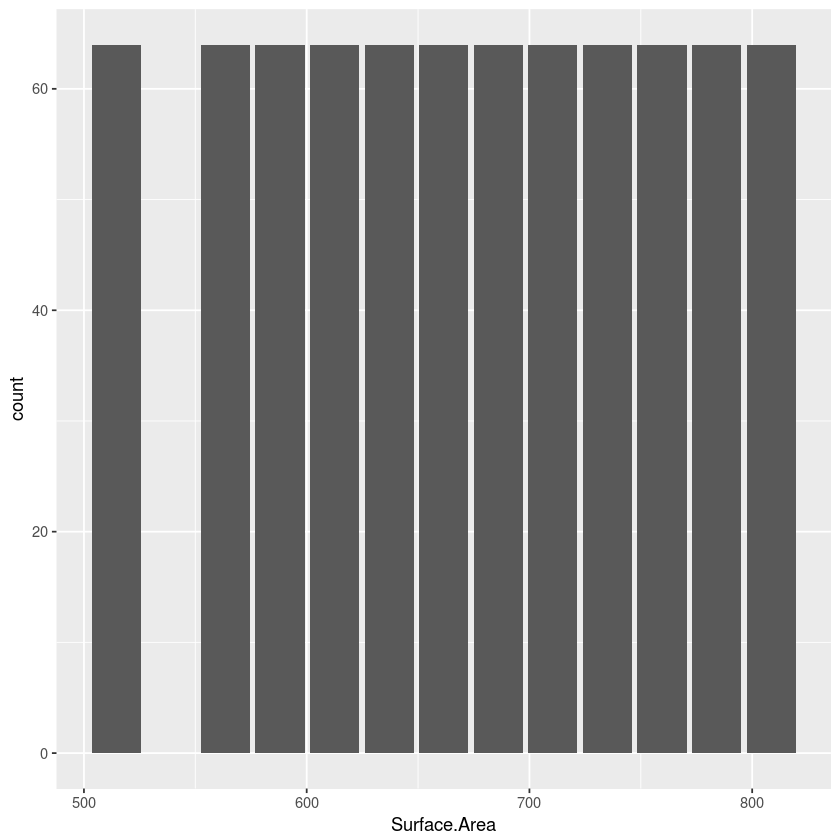

In [20]:
require(ggplot2)
ggplot(bldg.energy, aes(Surface.Area)) + ## Specify the data frame and columns. Note the + chain operator
     geom_bar()  ## Fuction for the plot type

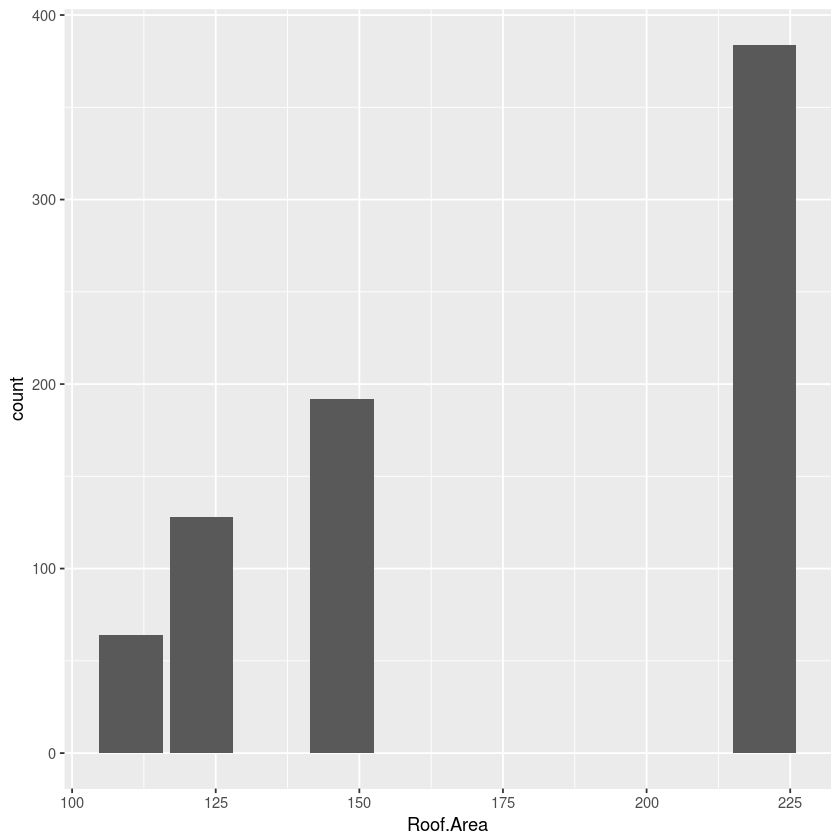

In [21]:
require(ggplot2)
ggplot(bldg.energy, aes(Roof.Area)) + ## Specify the data frame and columns. Note the + chain operator
     geom_bar()  ## Fuction for the plot type

## Histograms

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


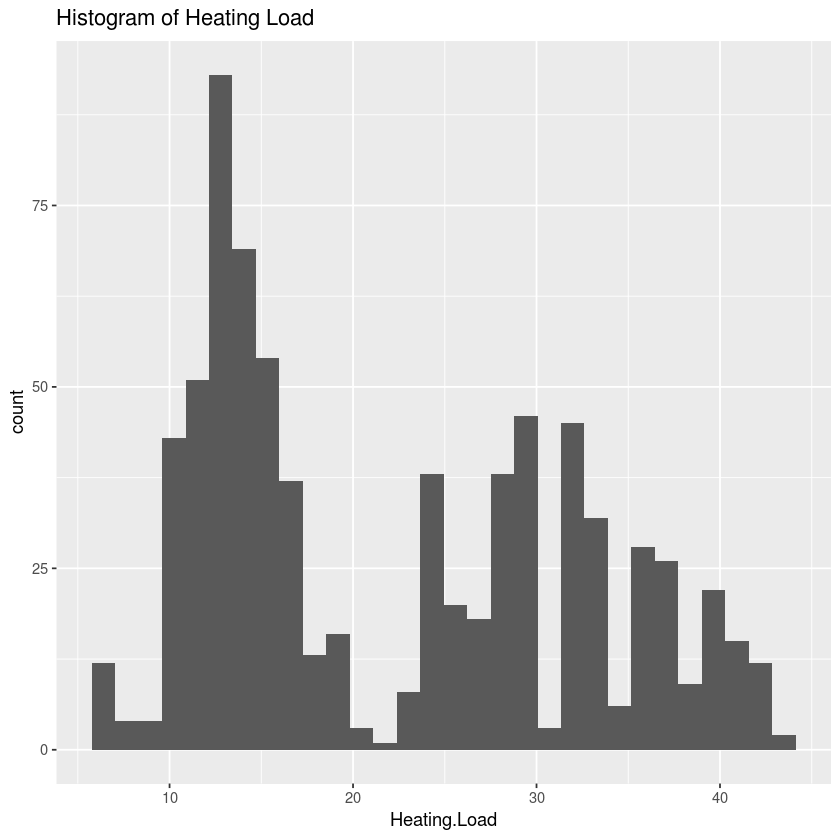

In [22]:
require(ggplot2)
ggplot(bldg.energy, aes(Heating.Load)) + ## Specify the data frame and columns. Note the + chain operator
     geom_histogram() + ## Fuction for the plot type 
     ggtitle('Histogram of Heating Load')

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


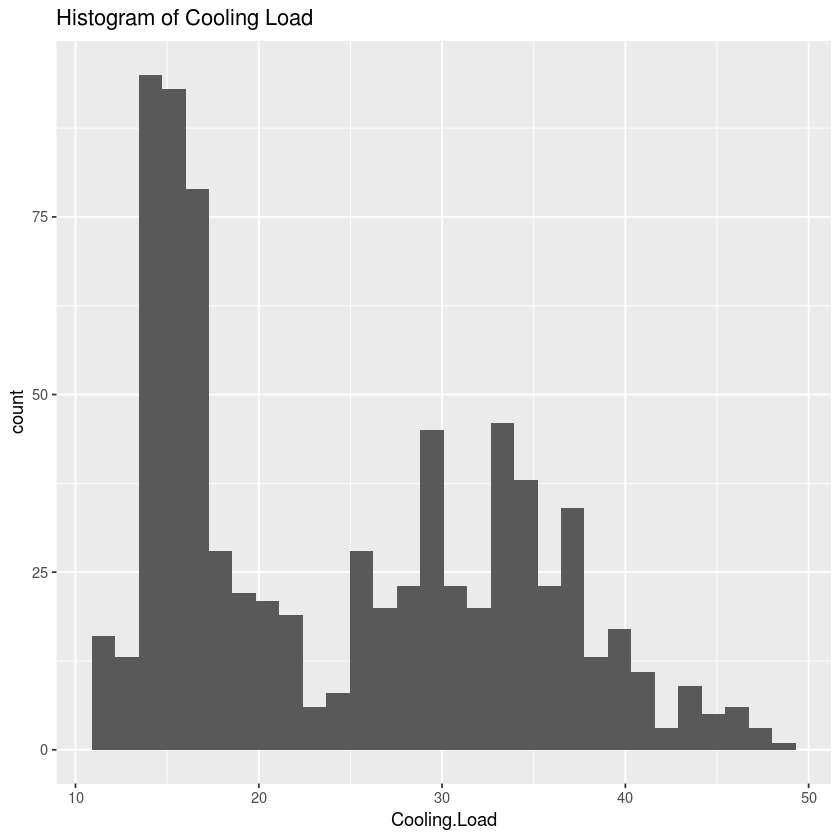

In [23]:
require(ggplot2)
ggplot(bldg.energy, aes(Cooling.Load)) + ## Specify the data frame and columns. Note the + chain operator
     geom_histogram() + ## Fuction for the plot type 
     ggtitle('Histogram of Cooling Load')

## Box Plots

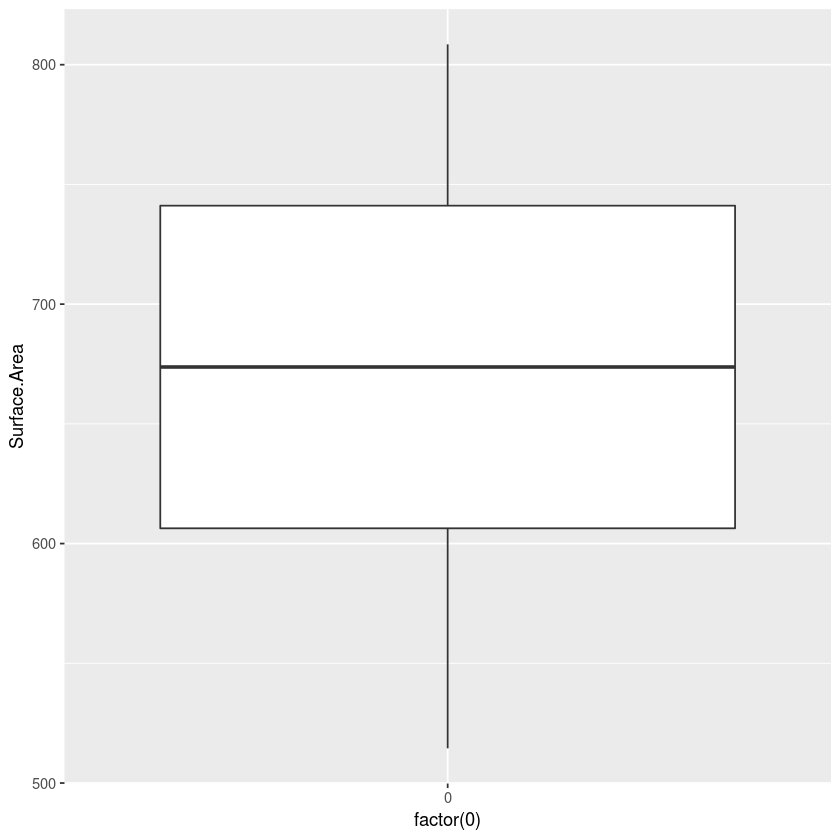

In [24]:
ggplot(bldg.energy, 
       aes(x = factor(0), 
           y = Surface.Area)) + 
geom_boxplot()

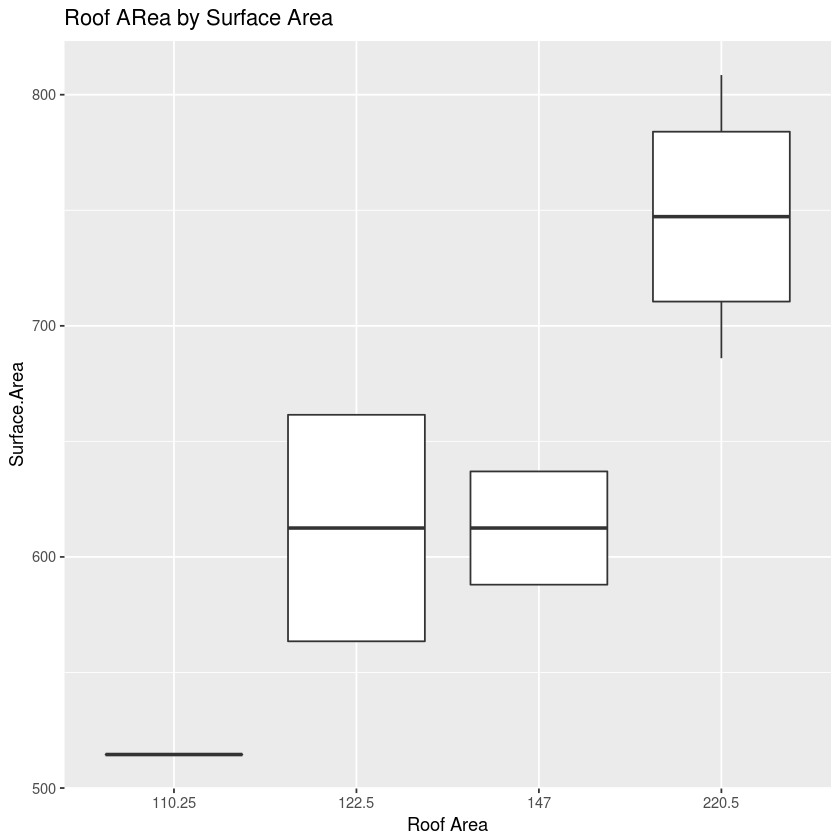

In [25]:
ggplot(bldg.energy, 
       aes(x = factor(Roof.Area), 
           y = Surface.Area)) + 
geom_boxplot() +
xlab('Roof Area') +
ggtitle('Roof ARea by Surface Area')

## Kernel density estimation

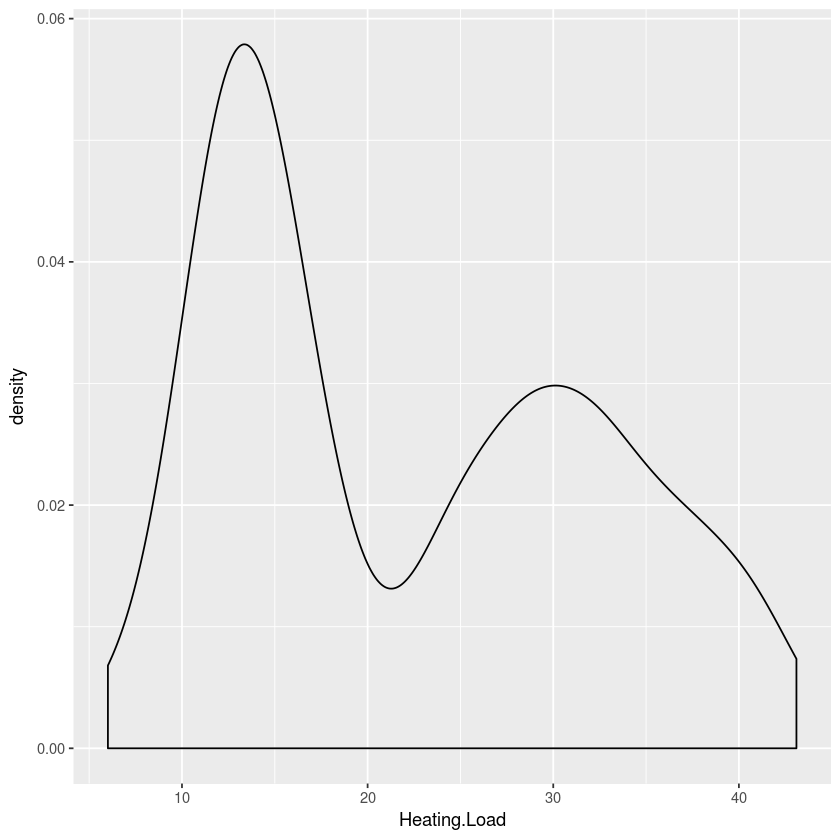

In [26]:
ggplot(bldg.energy, aes(Heating.Load)) + geom_density()

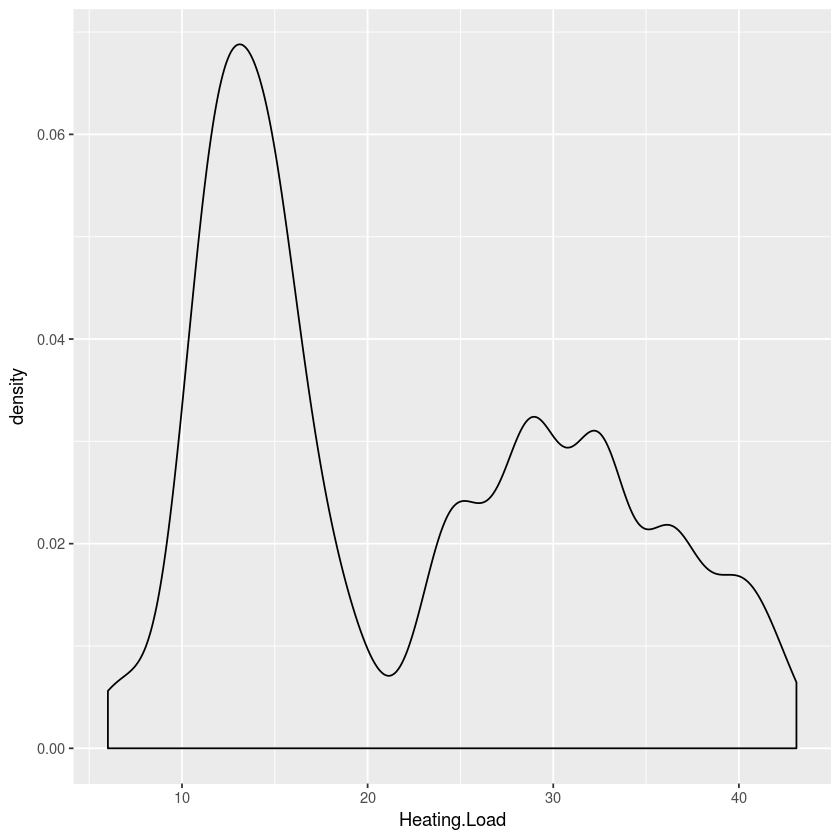

In [27]:
ggplot(bldg.energy, aes(Heating.Load)) + 
geom_density(adjust = 0.6)

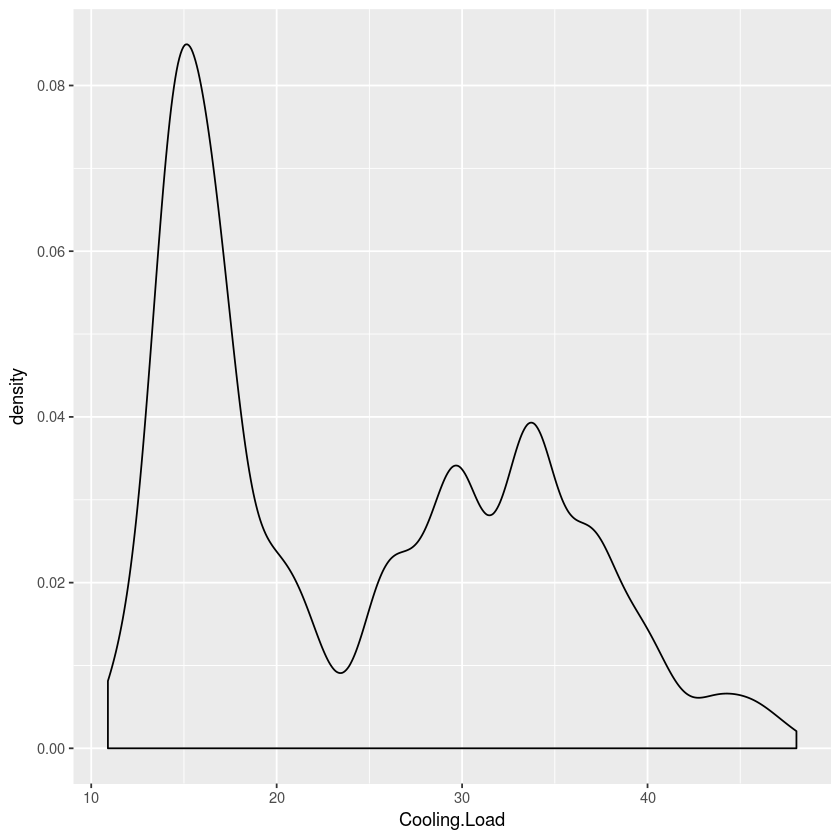

In [28]:
ggplot(bldg.energy, aes(Cooling.Load)) + 
geom_density(adjust = 0.5)

#### Violin Plots

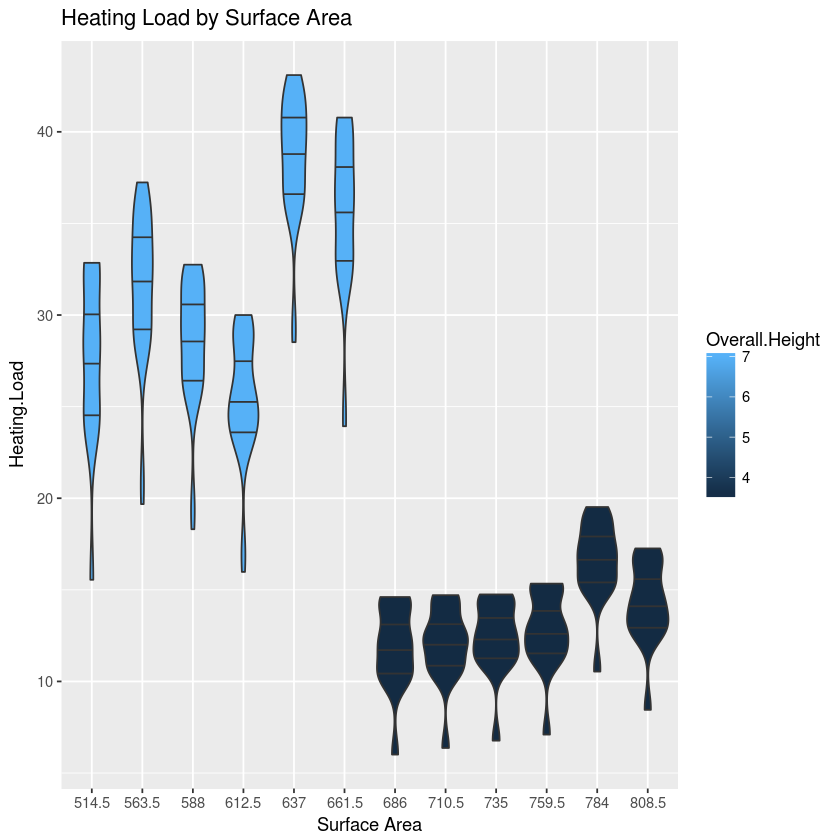

In [29]:
ggplot(bldg.energy, 
       aes(x = factor(Surface.Area), y = Heating.Load,
          fill = Overall.Height)) +
    geom_violin(trim = TRUE, 
                draw_quantiles = c(0.25, 0.5, 0.75)) +
    xlab('Surface Area')  + 
ggtitle('Heating Load by Surface Area')

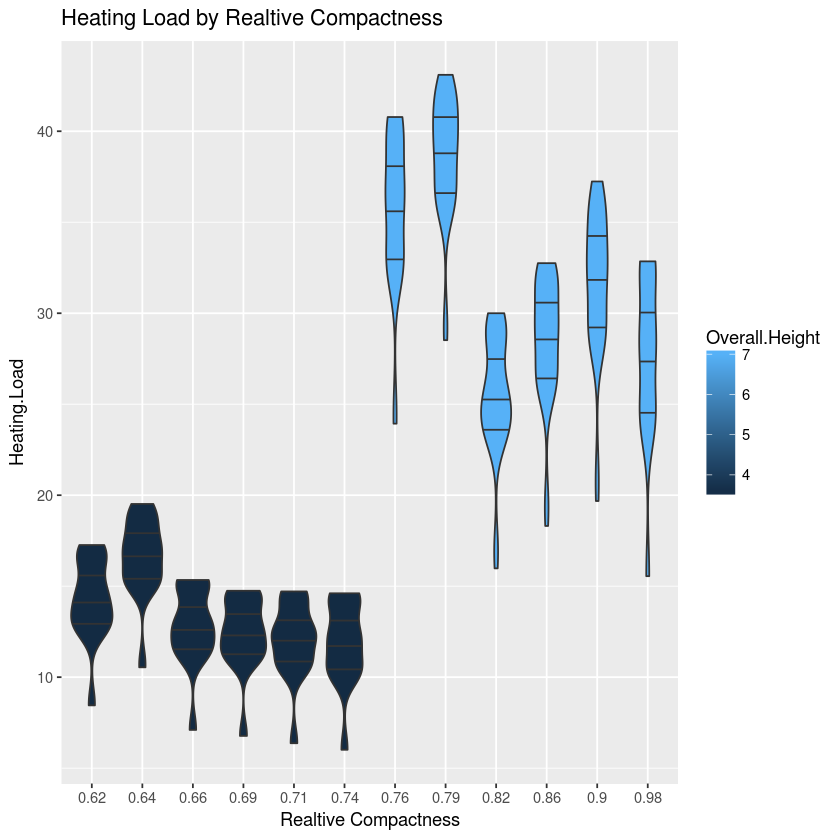

In [30]:
ggplot(bldg.energy, 
       aes(x = factor(Relative.Compactness), y = Heating.Load,
          fill = Overall.Height)) +
    geom_violin(trim = TRUE, 
                draw_quantiles = c(0.25, 0.5, 0.75)) +
    xlab('Realtive Compactness')  + 
ggtitle('Heating Load by Realtive Compactness')

# AHA! 
# Roof Area Doesn't Matter; Height Does!

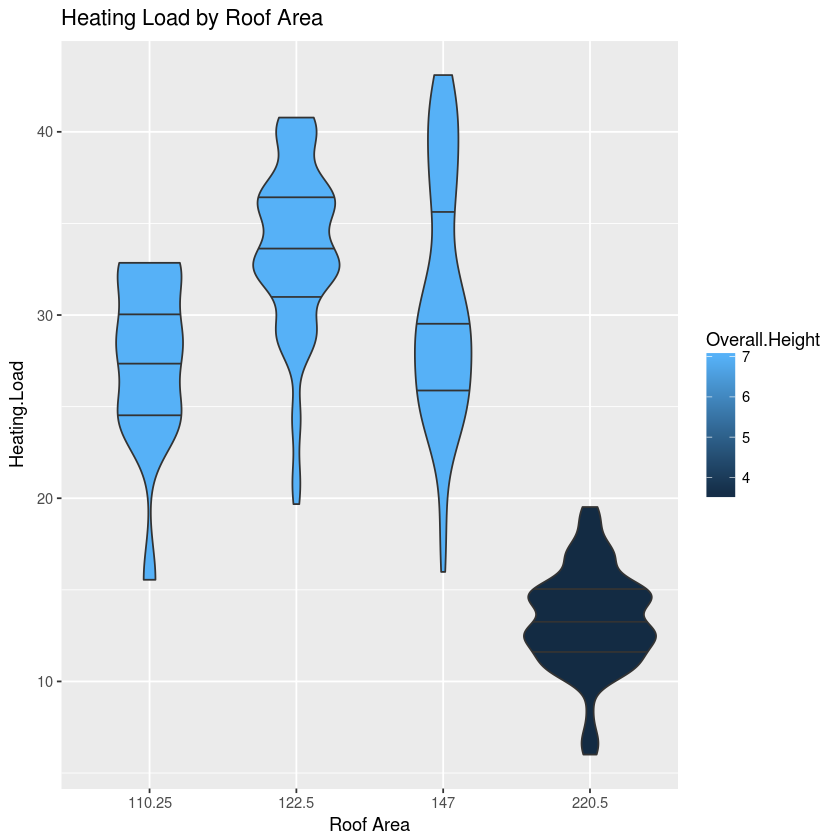

In [31]:
ggplot(bldg.energy, 
       aes(x = factor(Roof.Area), y = Heating.Load,
          fill = Overall.Height)) +
    geom_violin(trim = TRUE, 
                draw_quantiles = c(0.25, 0.5, 0.75)) +
    xlab('Roof Area')  + 
ggtitle('Heating Load by Roof Area')

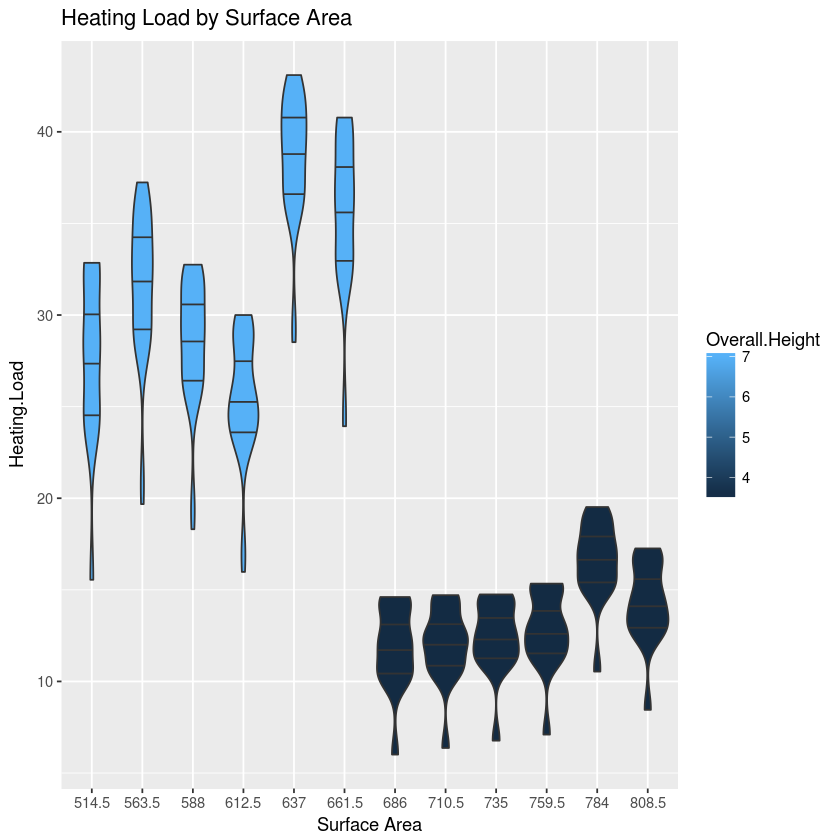

In [32]:
ggplot(bldg.energy, 
       aes(x = factor(Surface.Area), y = Heating.Load,
          fill = Overall.Height)) +
    geom_violin(trim = TRUE, 
                draw_quantiles = c(0.25, 0.5, 0.75)) +
    xlab('Surface Area')  + 
ggtitle('Heating Load by Surface Area')

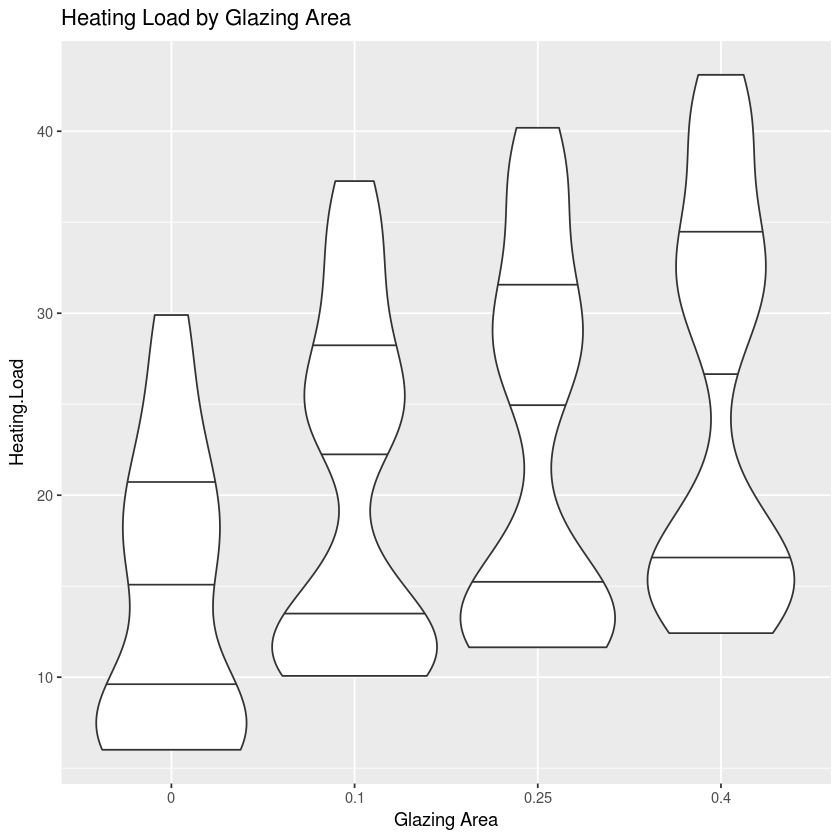

In [33]:
ggplot(bldg.energy, 
       aes(x = factor(Glazing.Area), y = Heating.Load,
          color = Overall.Height)) +
    geom_violin(trim = TRUE, 
                draw_quantiles = c(0.25, 0.5, 0.75)) +
    xlab('Glazing Area')  + 
ggtitle('Heating Load by Glazing Area')

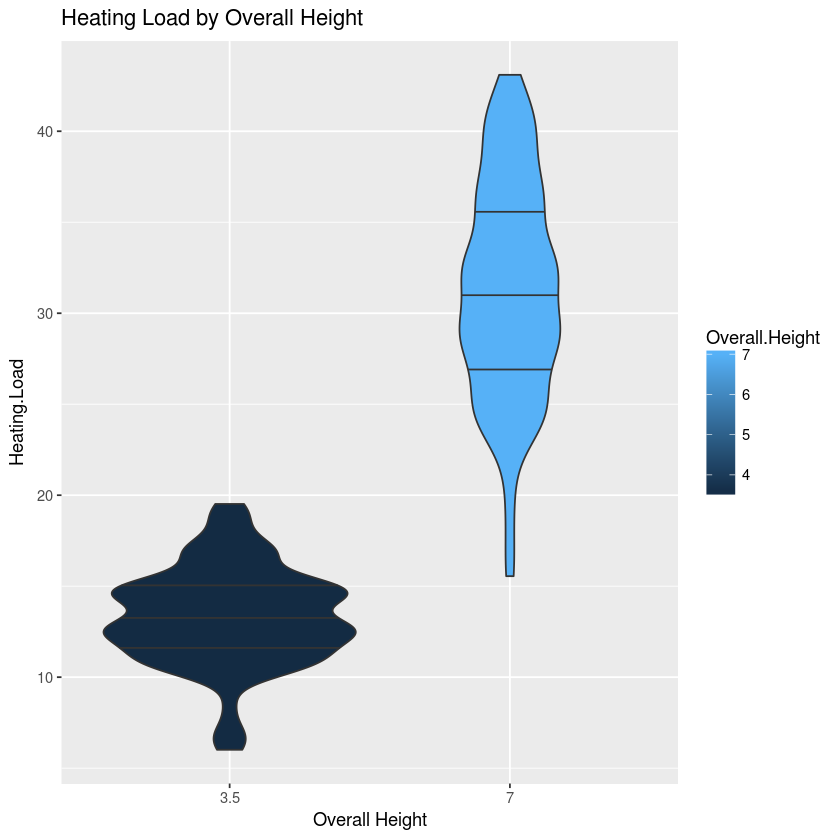

In [34]:
ggplot(bldg.energy, 
       aes(x = factor(Overall.Height), y = Heating.Load,
          fill = Overall.Height)) +
    geom_violin(trim = TRUE, 
                draw_quantiles = c(0.25, 0.5, 0.75)) +
    xlab('Overall Height')  + 
ggtitle('Heating Load by Overall Height')

## Statter Plots

Once gain, moving straight to correlation. Roof Area and Overall Height have the strongest correlation to heating & cooling load, followed by Wall area. Orientatin's irrelavent, Glazing Area & Distribution doesn't mean much either.

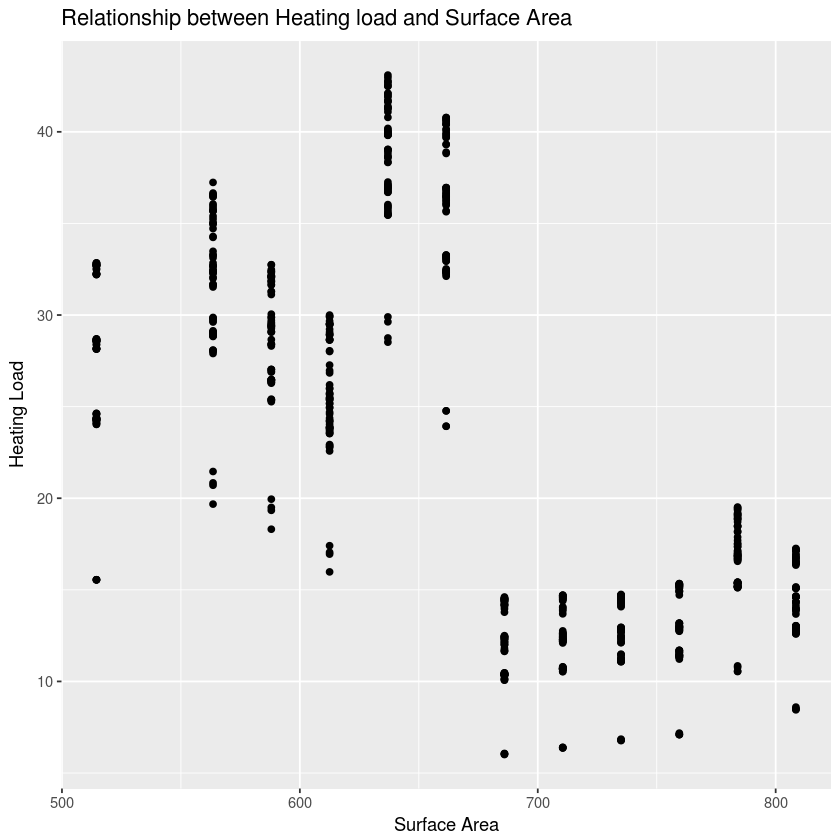

In [35]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, y = Heating.Load), alpha = 0.3) + 
geom_point() + 
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

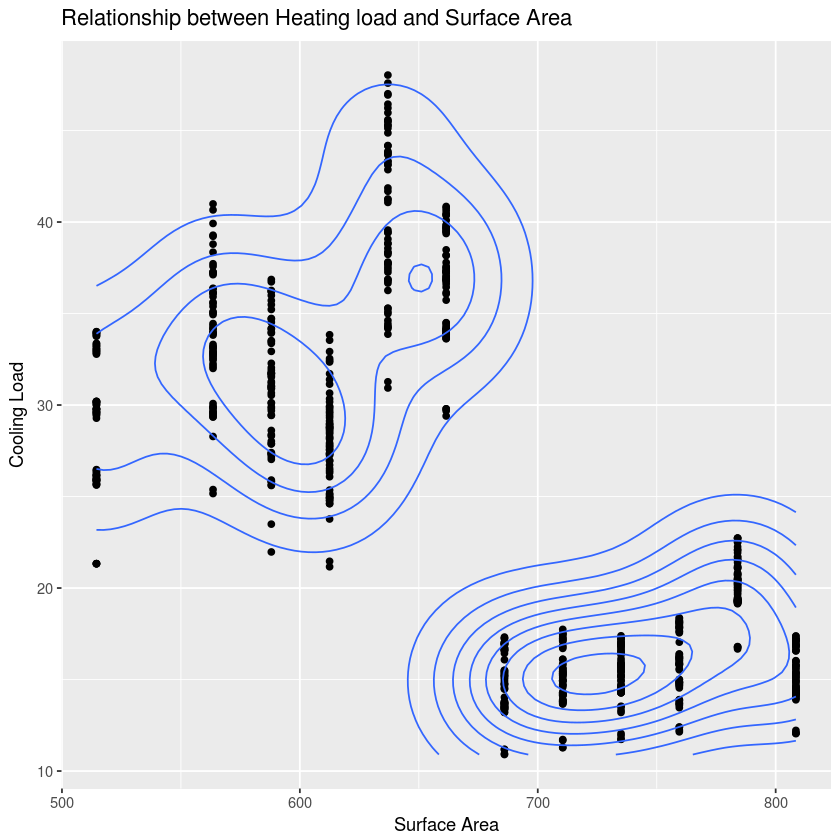

In [36]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, y = Cooling.Load)) + 
geom_point() + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Cooling Load') + 
ggtitle('Relationship between Heating load and Surface Area')

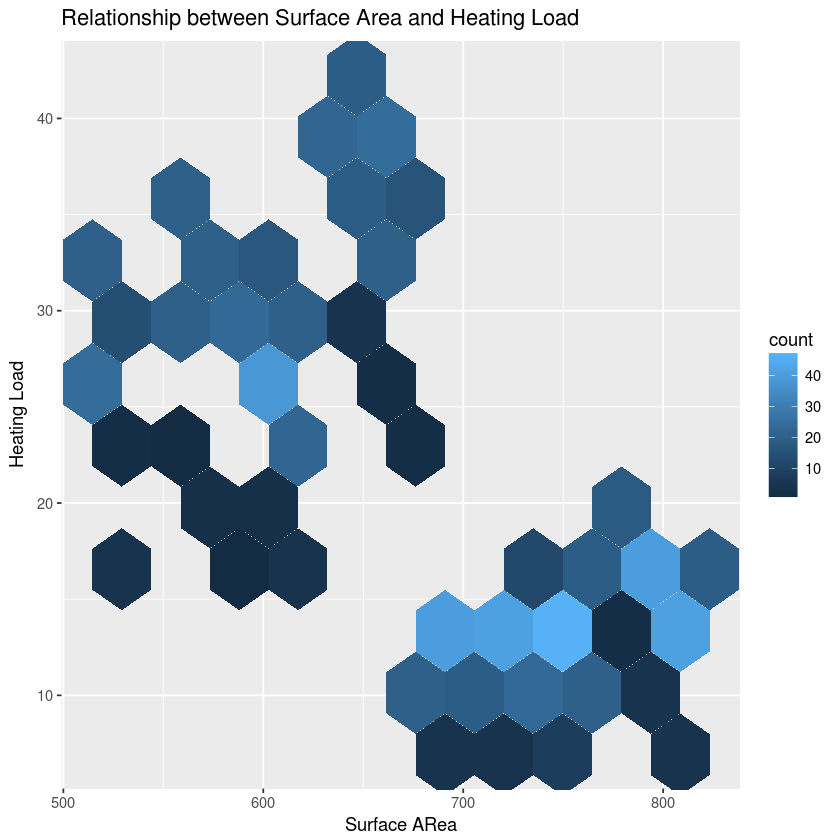

In [37]:
ggplot(bldg.energy, aes(Surface.Area, Heating.Load)) + 
    stat_binhex(bins = 10) +
    xlab('Surface ARea') + ylab('Heating Load') +
    ggtitle('Relationship between Surface Area and Heating Load')

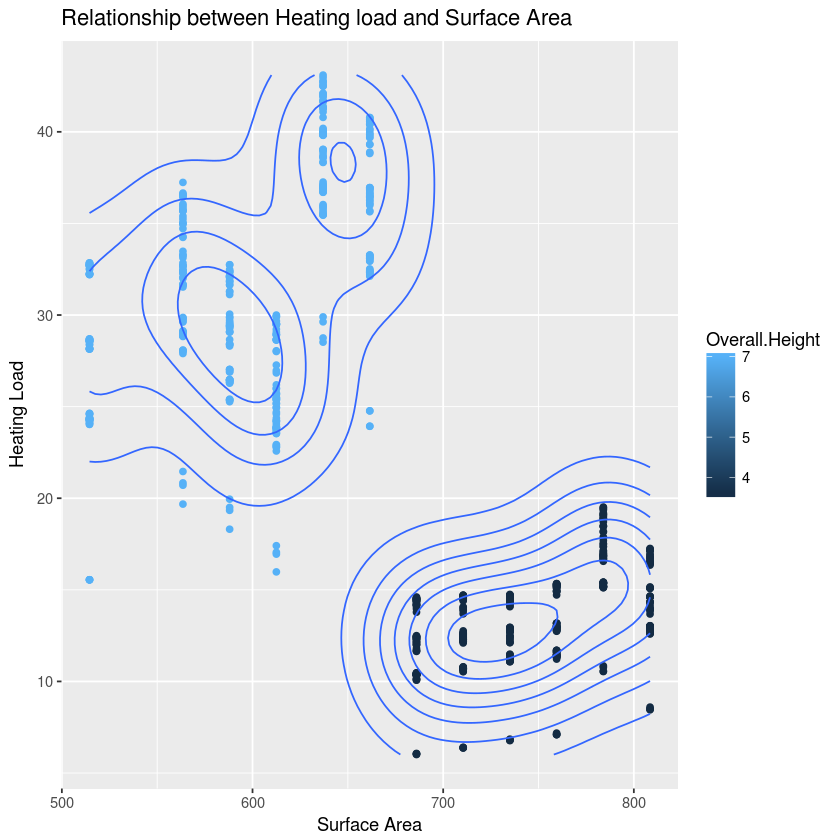

In [38]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, 
           y = Heating.Load,
           color = Overall.Height),
           alpha = 0.9) + 
geom_point() + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

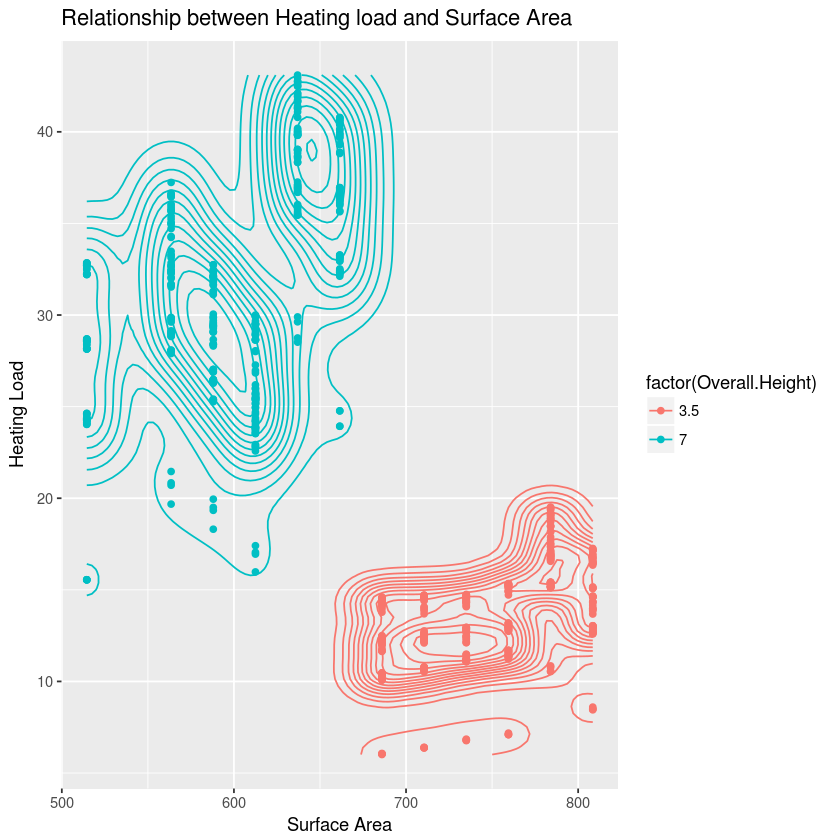

In [39]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, 
           y = Heating.Load,
           color = factor(Overall.Height)),
           alpha = 0.9) + 
geom_point() + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

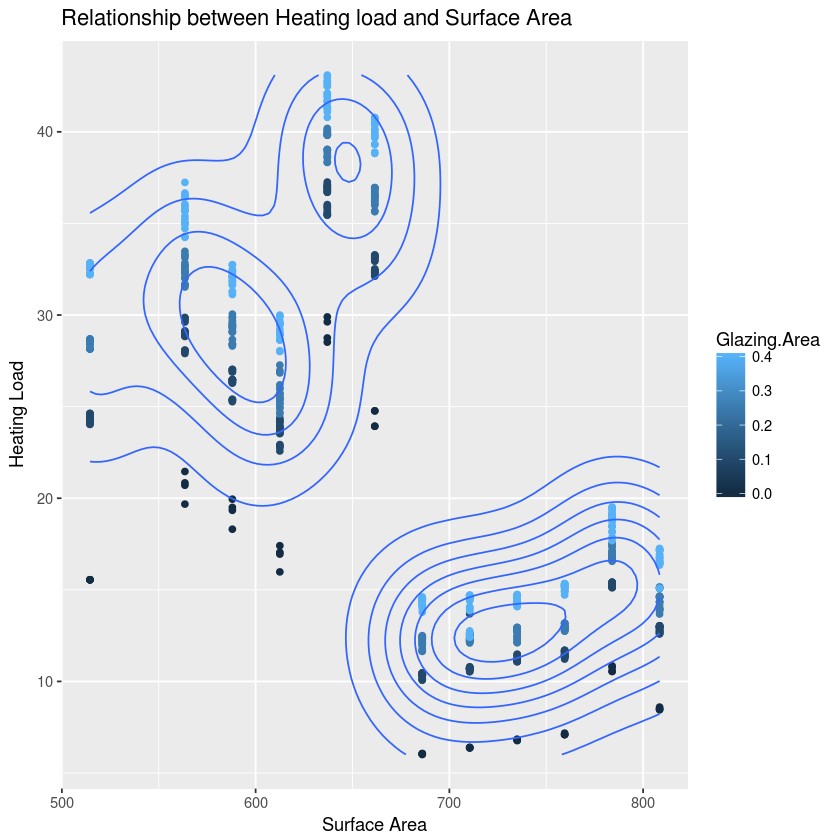

In [40]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, 
           y = Heating.Load,
           color = Glazing.Area)) + 
geom_point() + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

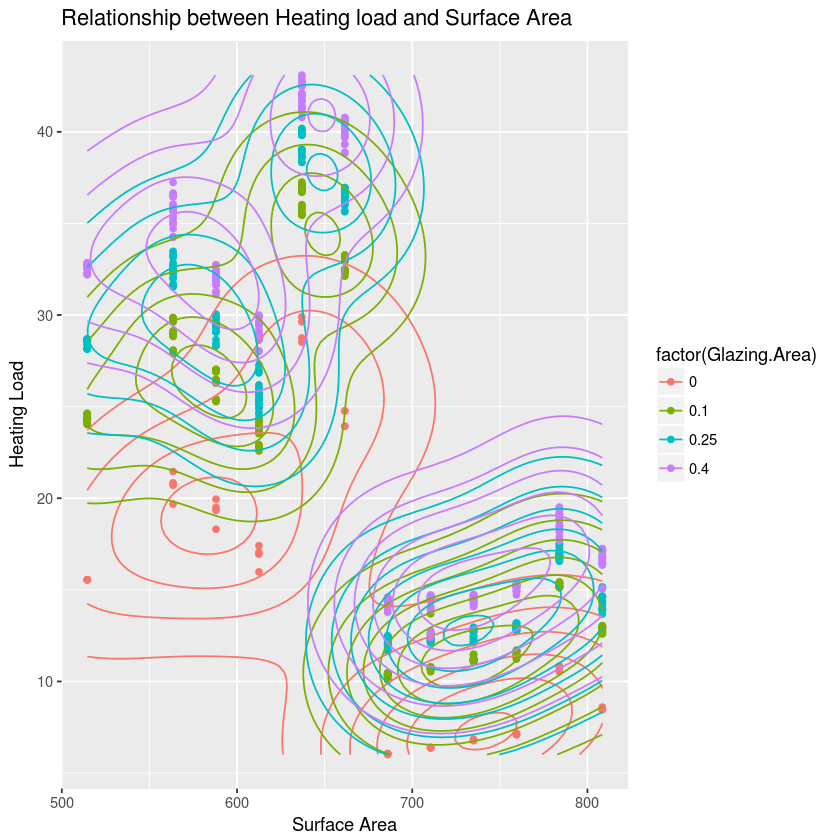

In [41]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, 
           y = Heating.Load,
           color = factor(Glazing.Area))) + 
geom_point() + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

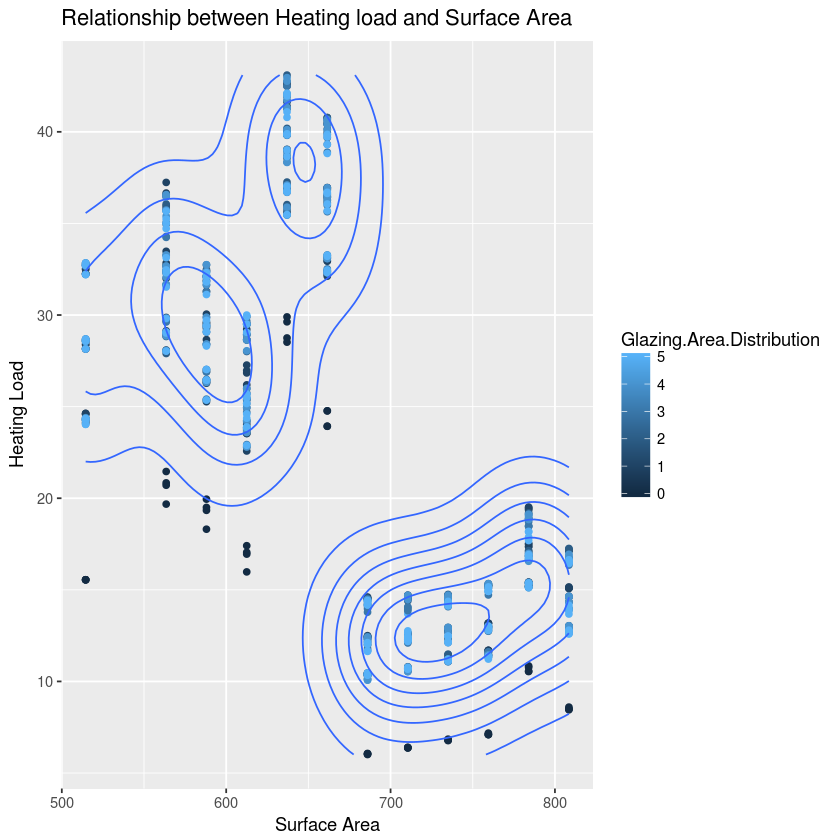

In [42]:
ggplot(bldg.energy, 
       aes(x = Surface.Area, 
           y = Heating.Load,
           color = Glazing.Area.Distribution)) + 
geom_point() + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

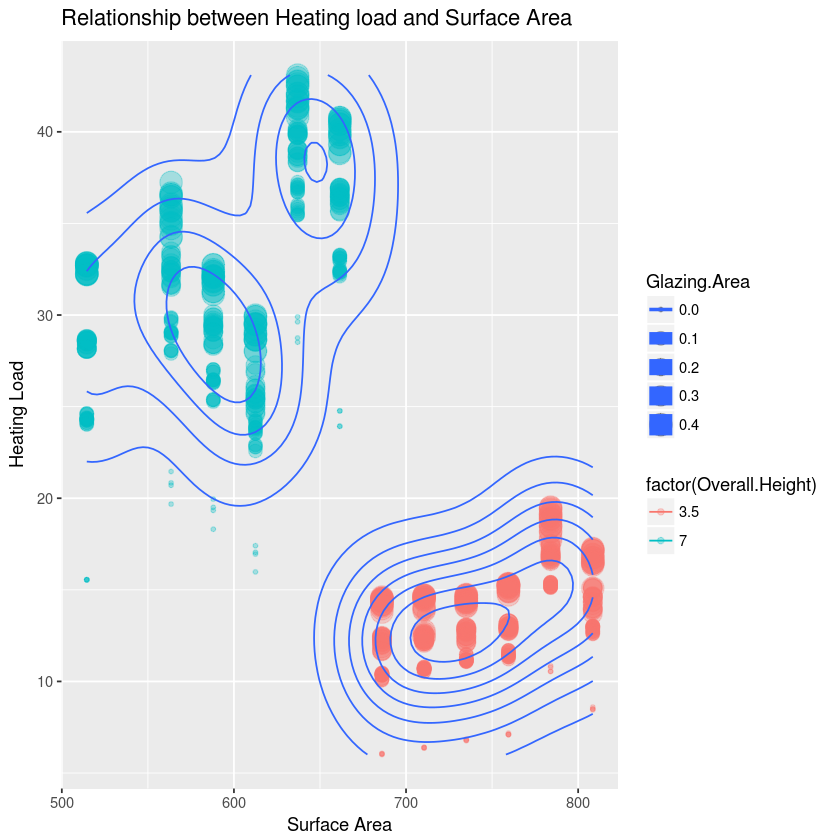

In [43]:
ggplot(bldg.energy, aes(x = Surface.Area, 
           y = Heating.Load,))+ 
geom_point(aes(color = factor(Overall.Height),
               size = Glazing.Area),
               alpha = 0.3) + 
geom_density2d() +
xlab('Surface Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Surface Area')

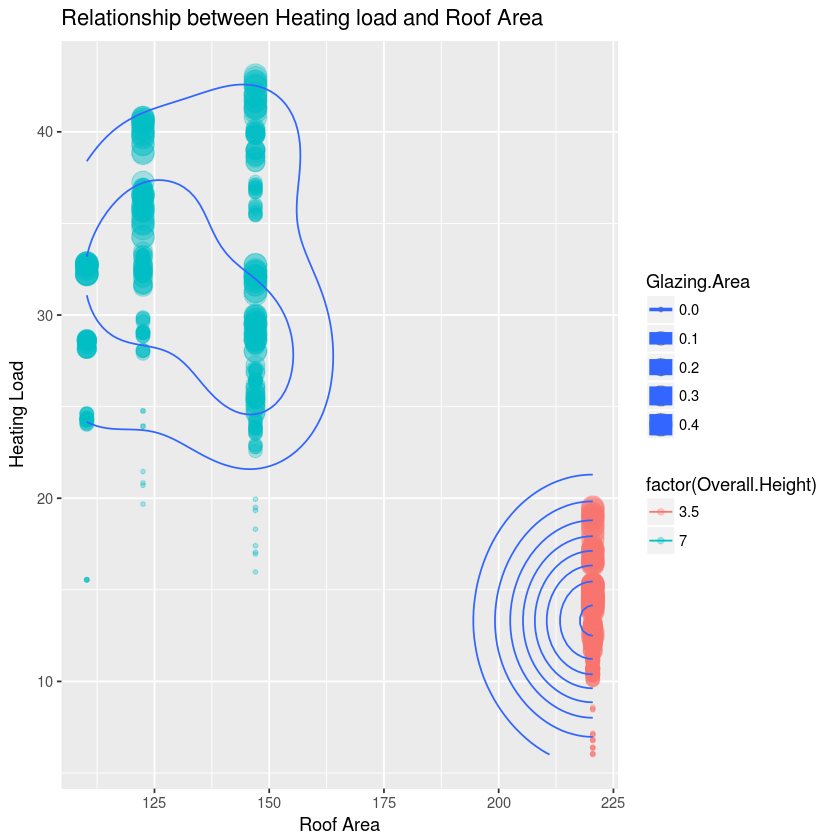

In [44]:
ggplot(bldg.energy, aes(x = Roof.Area, 
           y = Heating.Load,))+ 
geom_point(aes(color = factor(Overall.Height),
               size = Glazing.Area),
               alpha = 0.3) + 
geom_density2d() +
xlab('Roof Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Roof Area')

I'm going to avoid talking about covariance so I don't get a headache; moving straight to correlation. There's a strong correlation between Relative.Compactness and Overall.Height, a weak corelation betwen Glazing.Area and Glazing.Area.Distribution; all other correlatioans are neglitible.

Let's open the aperture a bit and look at the rest of the buidlign energy dataset.

## Scatterplot matrices (I hope)
Code based on [Scatterplot matrices with ggplot](https://gastonsanchez.wordpress.com/2012/08/27/scatterplot-matrices-with-ggplot/) by [Gaston Scanchez](http://www.gastonsanchez.com/) in [Data Anaysis Visually Enforced](https://gastonsanchez.wordpress.com/)

Background color from [pakt](https://www.packtpub.com/mapt/book/big_data_and_business_intelligence/9781849513067/2/ch02lvl1sec03/setting-plot-background-colors)

Dot color form [stack overflow](https://stackoverflow.com/questions/15599717/coloring-points-in-a-pairs-plot)

Histogram diagonals & correlation from [R Graphics Cookbook](https://rstudio-pubs-static.s3.amazonaws.com/86962_975473a9afe44d03832f9a65bc1a39c2.html)

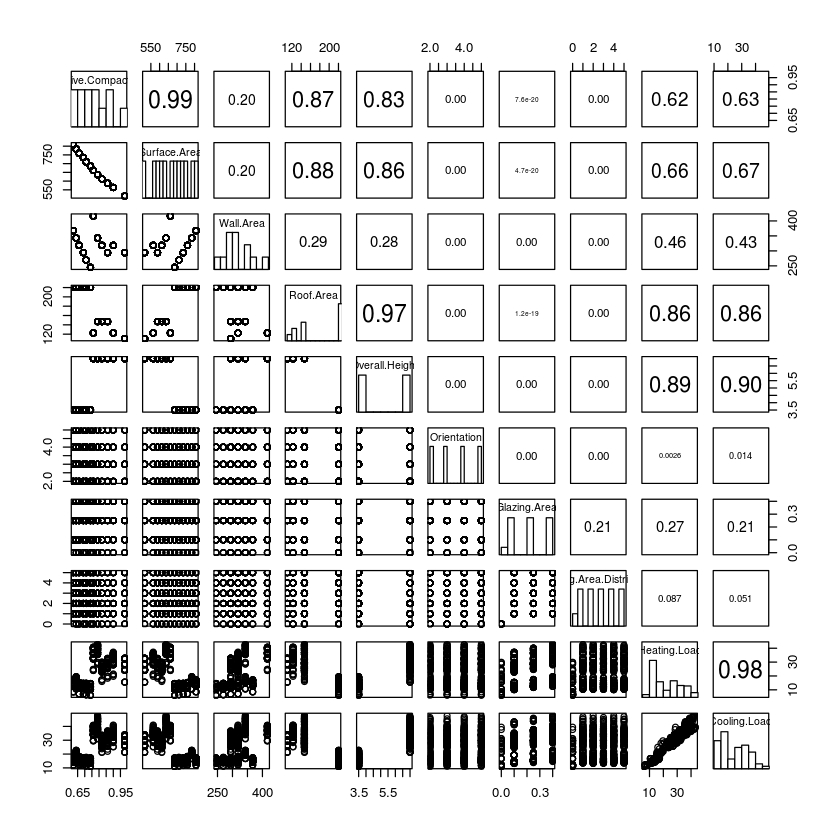

In [45]:
panel.hist = function(x, ...){
  usr = par('usr')
  on.exit(par(usr))
  par(usr = c(usr[1:2], 0, 1.5))
  h = hist(x, plot=FALSE)
  breaks = h$breaks
  nB = length(breaks)
  y=h$counts
  y=y/max(y)
  rect(breaks[-nB], 0, breaks[-1], y, col='white')
}

panel.cor = function(x, y, digits=2, prefix="", cex.cor, ...){
  usr = par("usr")
  on.exit(par(usr))
  par(usr = c(0,1,0,1))
  r = abs(cor(x,y,use='complete.obs'))
  txt=format(c(r,0.123456789),digits=digits)[1]
  txt=paste(prefix,txt,sep='')
  if(missing(cex.cor)) cex.cor = 0.8/strwidth(txt)
  text(0.5, 0.5, txt, cex = cex.cor*(1+r)/2)
}

pairs(bldg.energy[,0:10], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

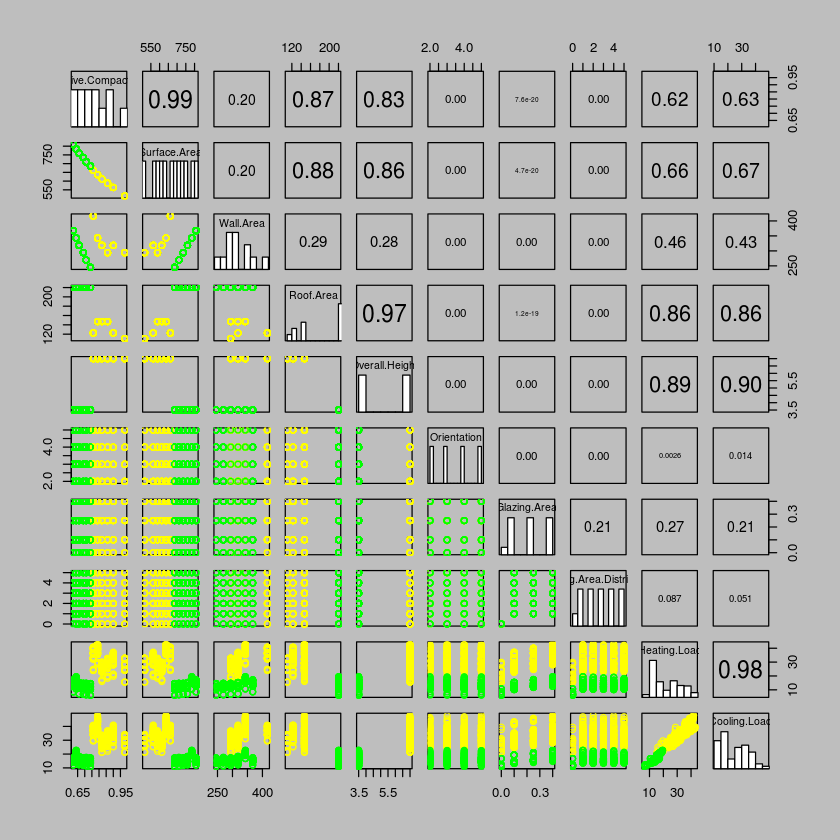

In [46]:
panel.hist = function(x, ...){
  usr = par('usr')
  on.exit(par(usr))
  par(usr = c(usr[1:2], 0, 1.5))
  h = hist(x, plot=FALSE)
  breaks = h$breaks
  nB = length(breaks)
  y=h$counts
  y=y/max(y)
  rect(breaks[-nB], 0, breaks[-1], y, col='white')
}

panel.cor = function(x, y, digits=2, prefix="", cex.cor, ...){
  usr = par("usr")
  on.exit(par(usr))
  par(usr = c(0,1,0,1))
  r = abs(cor(x,y,use='complete.obs'))
  txt=format(c(r,0.123456789),digits=digits)[1]
  txt=paste(prefix,txt,sep='')
  if(missing(cex.cor)) cex.cor = 0.8/strwidth(txt)
  text(0.5, 0.5, txt, cex = cex.cor*(1+r)/2)
}

par(bg="gray")

cols2 <- character(nrow(bldg.energy))
cols2[] <- "black"
cols2[bldg.energy$Overall.Height == 3.5] <- "green"
cols2[bldg.energy$Overall.Height == 7] <- "yellow"

pairs(bldg.energy[,0:10], 
      col=cols2, 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

In [47]:
bldg.interesting = bldg.energy[, c('Relative.Compactness', 
                               'Roof.Area',
                               'Overall.Height',
                               'Heating.Load')]

## Scatterplot, based on class example

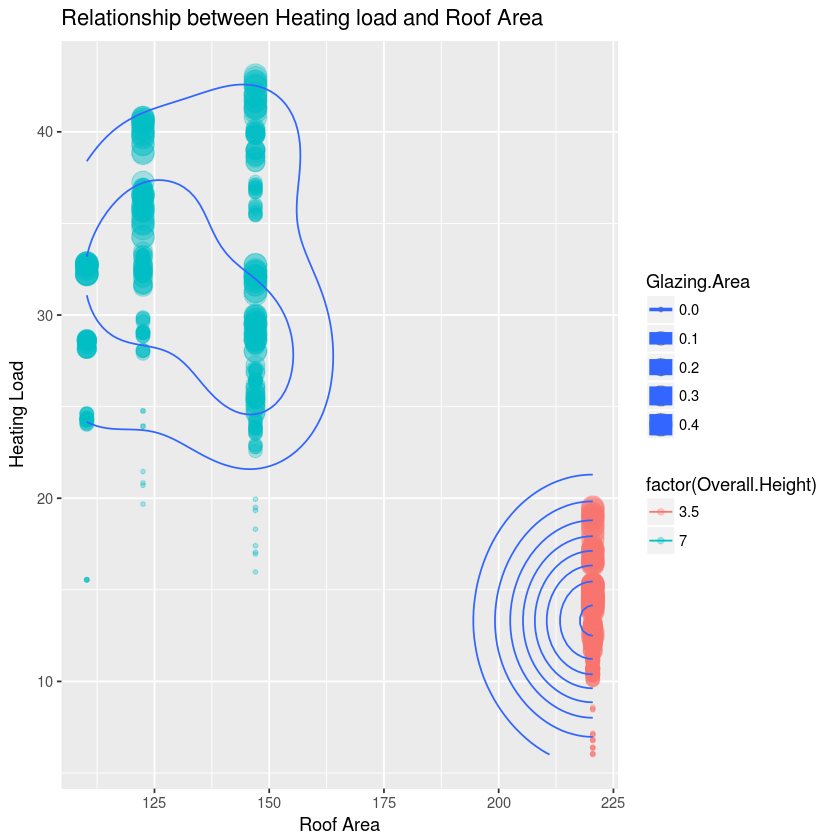

In [44]:
ggplot(bldg.energy, aes(x = Roof.Area, 
           y = Heating.Load,))+ 
geom_point(aes(color = factor(Overall.Height),
               size = Glazing.Area),
               alpha = 0.3) + 
geom_density2d() +
xlab('Roof Area') + 
ylab('Heating Load') + 
ggtitle('Relationship between Heating load and Roof Area')

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit negative part of the spread”

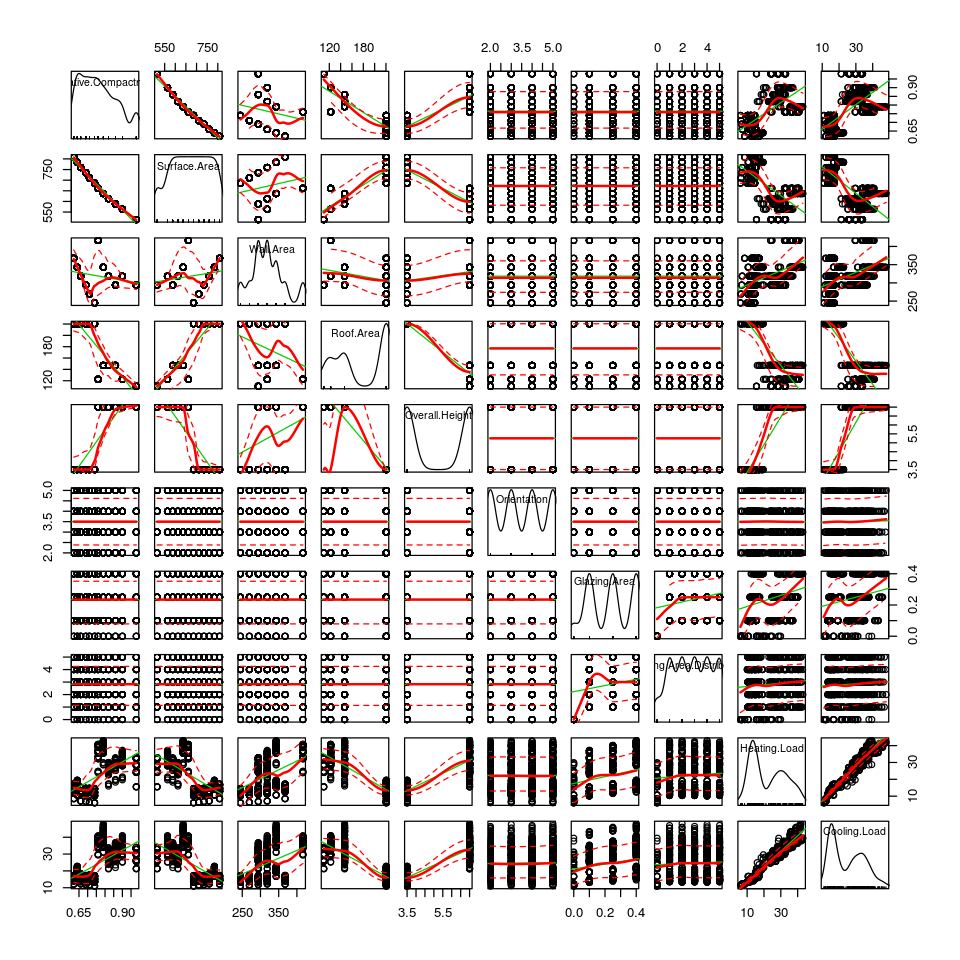

In [55]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ Relative.Compactness + Surface.Area +
                  Wall.Area + Roof.Area + Overall.Height +
                  Orientation + Glazing.Area + 
                  Glazing.Area.Distribution + Heating.Load + 
                  Cooling.Load, data = bldg.energy)

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit negative part of the spread”

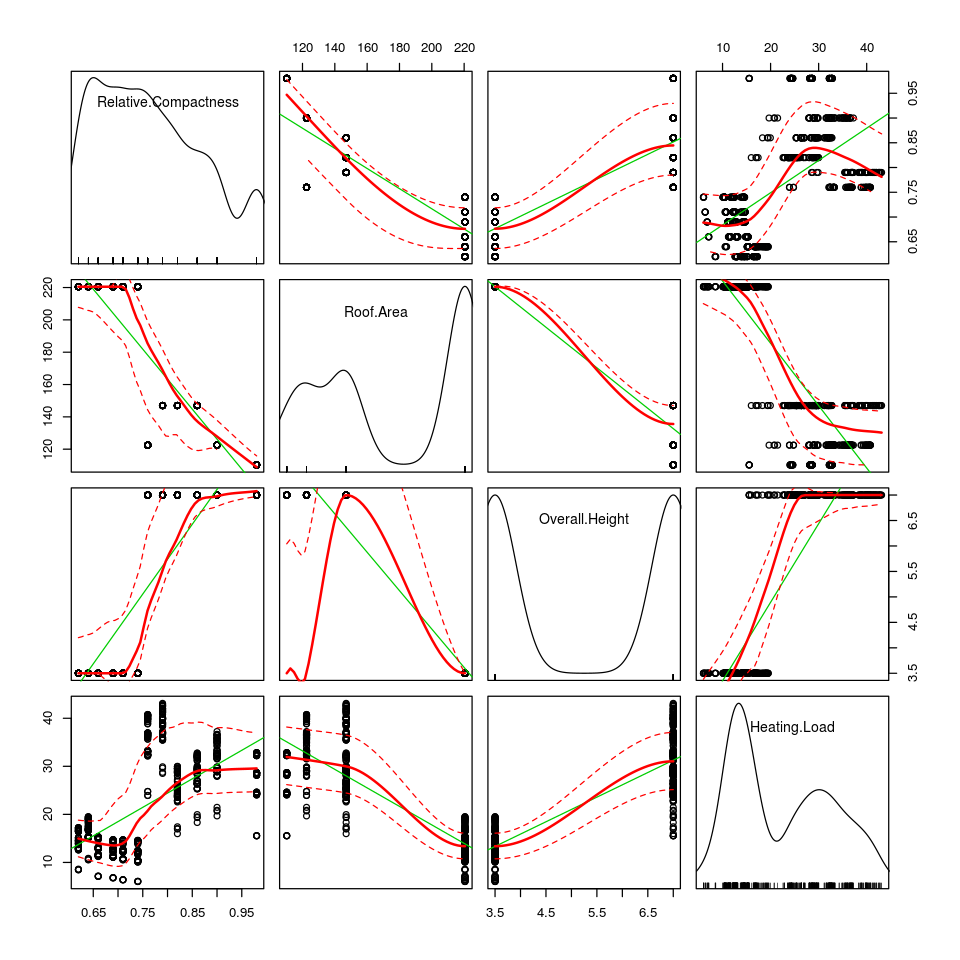

In [49]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ Relative.Compactness + Roof.Area +
                    Overall.Height + Heating.Load,
                    data = bldg.energy)

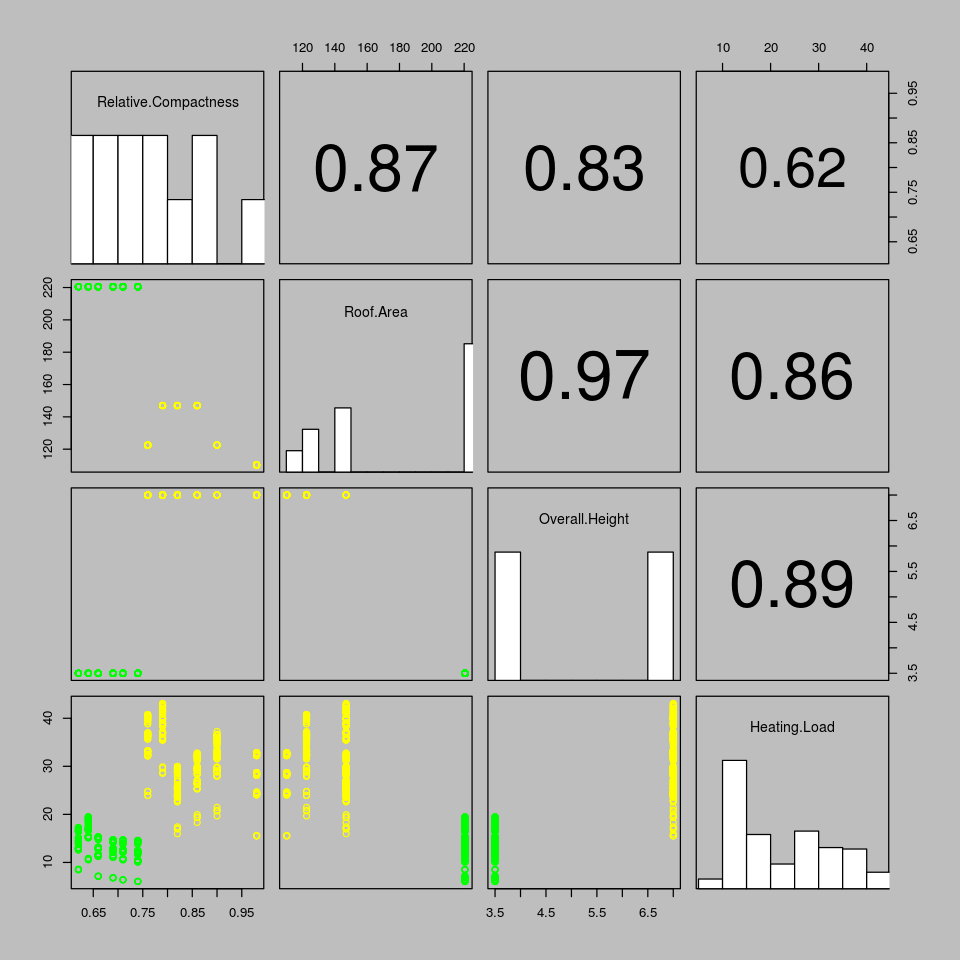

In [50]:
par(bg="gray")

cols2 <- character(nrow(bldg.energy))
cols2[] <- "black"
cols2[bldg.interesting$Overall.Height == 3.5] <- "green"
cols2[bldg.interesting$Overall.Height == 7] <- "yellow"

pairs(bldg.interesting[,0:4], col=cols2,
      diag.panel = panel.hist,
      upper.panel = panel.cor)

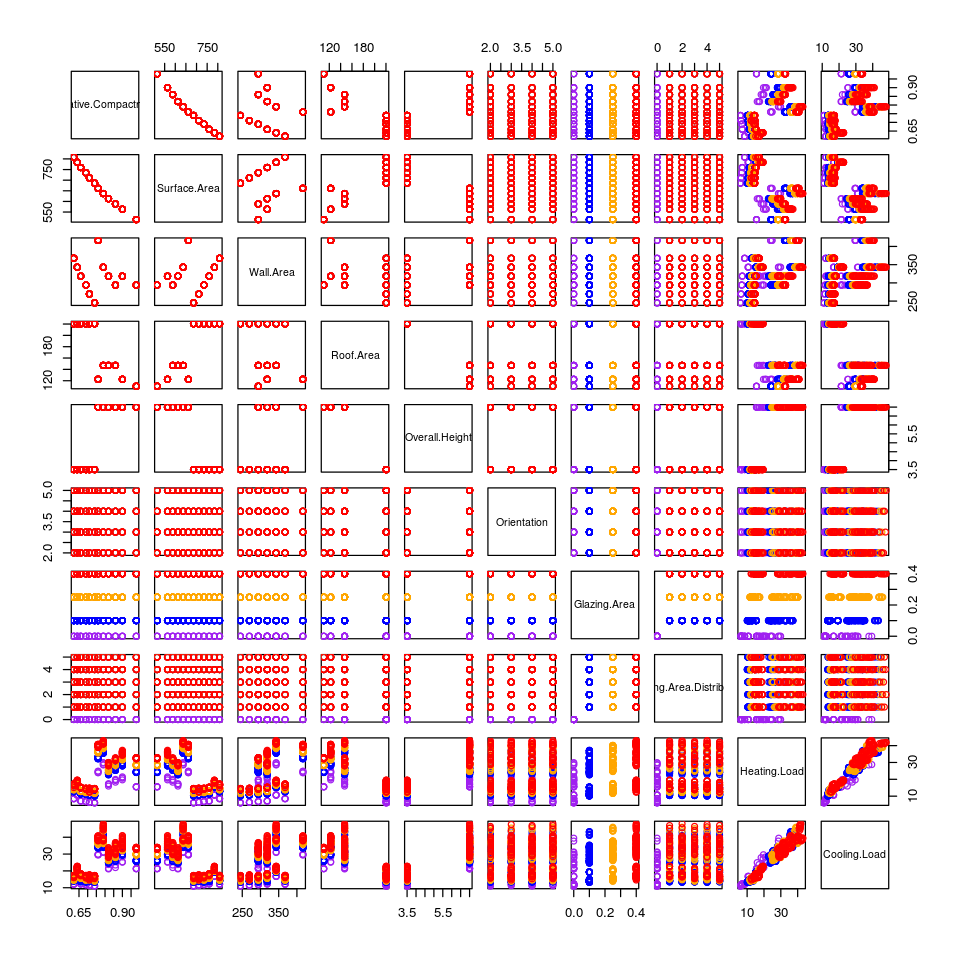

In [51]:
cols4 <- character(nrow(bldg.energy))
cols4[] <- "black"

cols4[bldg.energy == 0] <- "gray"
cols4[bldg.energy$Glazing.Area == 0]    <- "purple"
cols4[bldg.energy$Glazing.Area == 0.1]  <- "blue"
cols4[bldg.energy$Glazing.Area == 0.25] <- "orange"
cols4[bldg.energy$Glazing.Area == 0.4]  <- "red"

pairs(bldg.energy,col=cols4)

In [56]:
pairs(bldg.interesting[,0:5],col=cols4)

ERROR: Error in `[.data.frame`(bldg.interesting, , 0:5): undefined columns selected


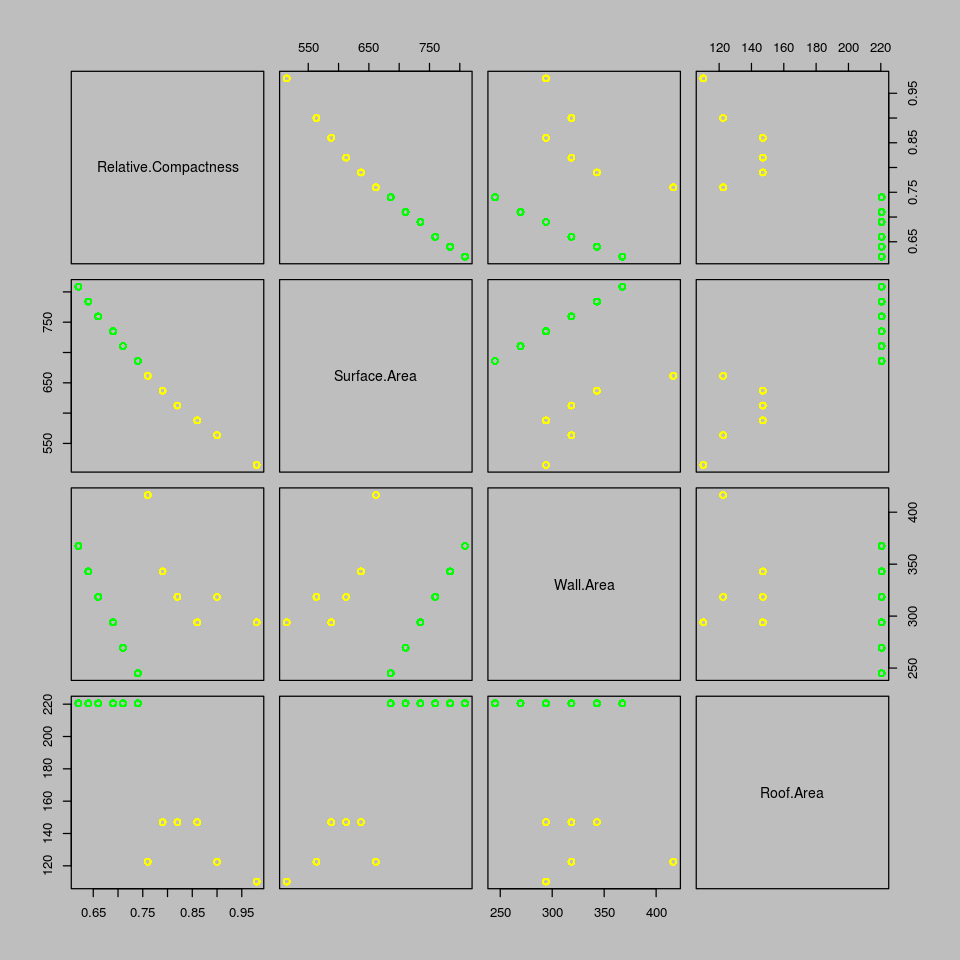

In [57]:
par(bg="gray")
pairs(bldg.energy[,0:4], col=cols2)

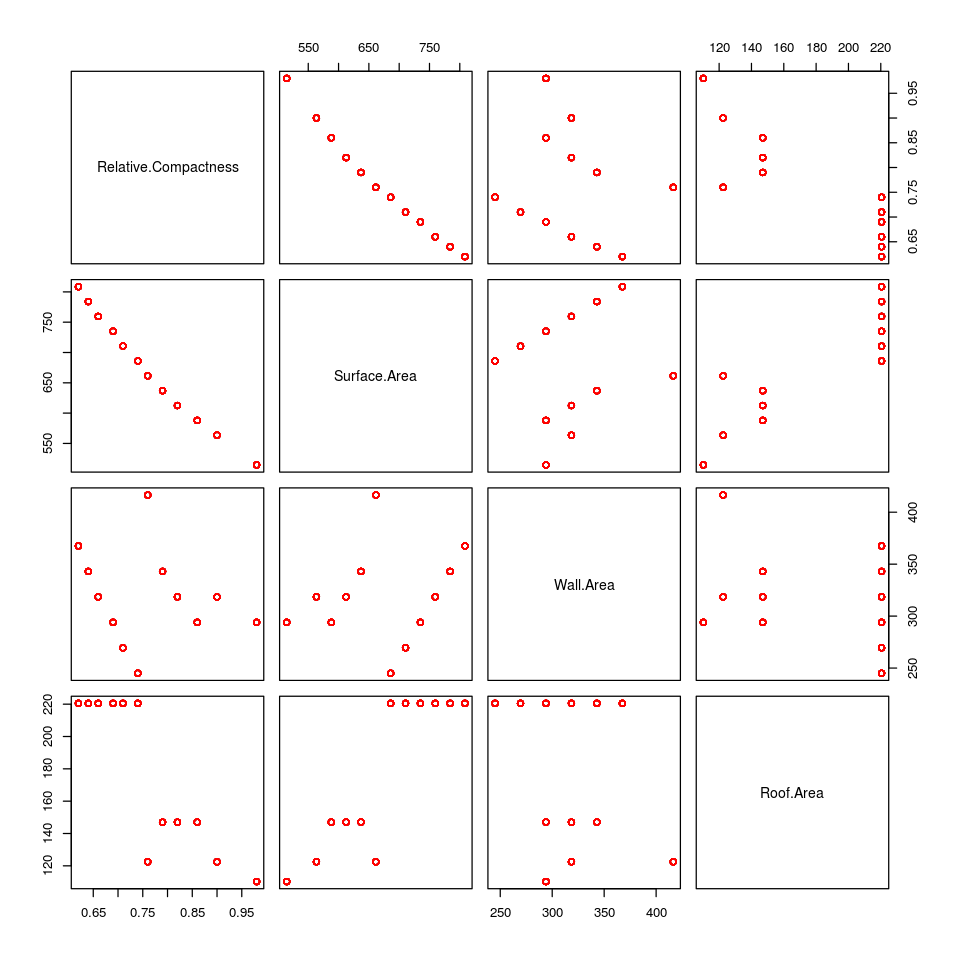

In [58]:
pairs(bldg.energy[,0:4], col=cols4)

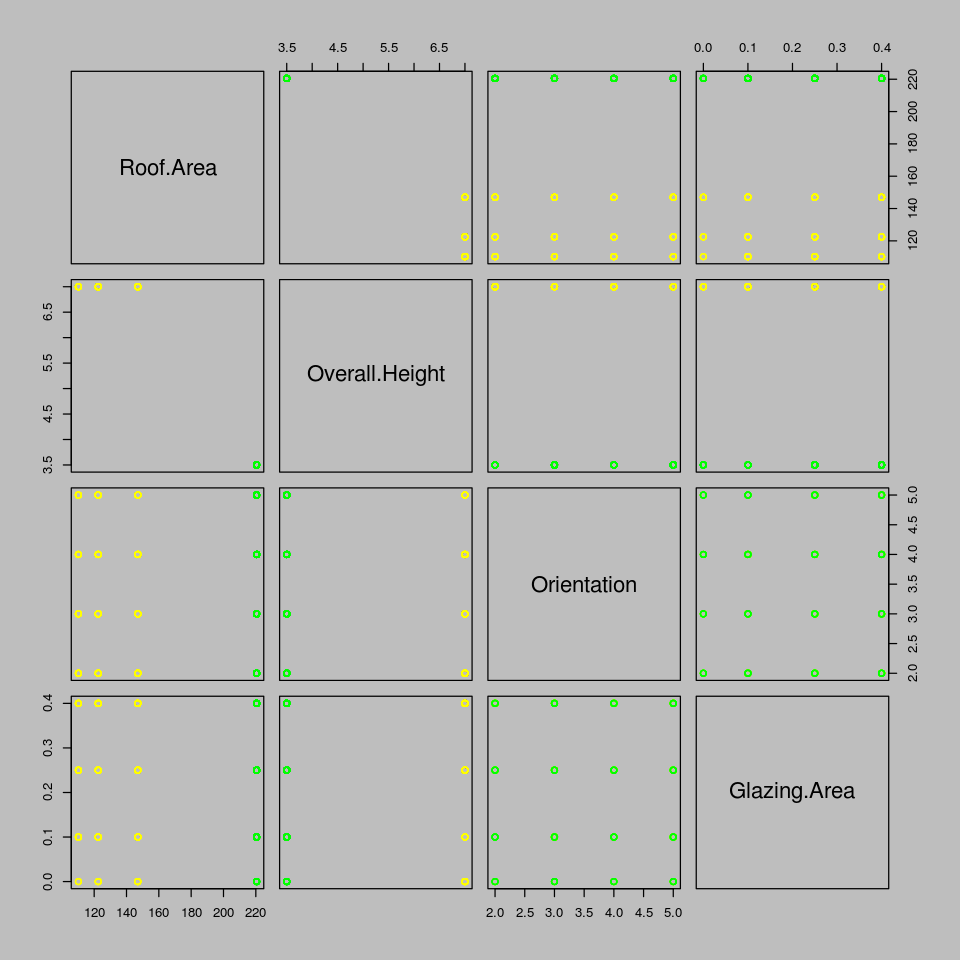

In [59]:
par(bg="gray")
pairs(bldg.energy[,4:7], col=cols2)

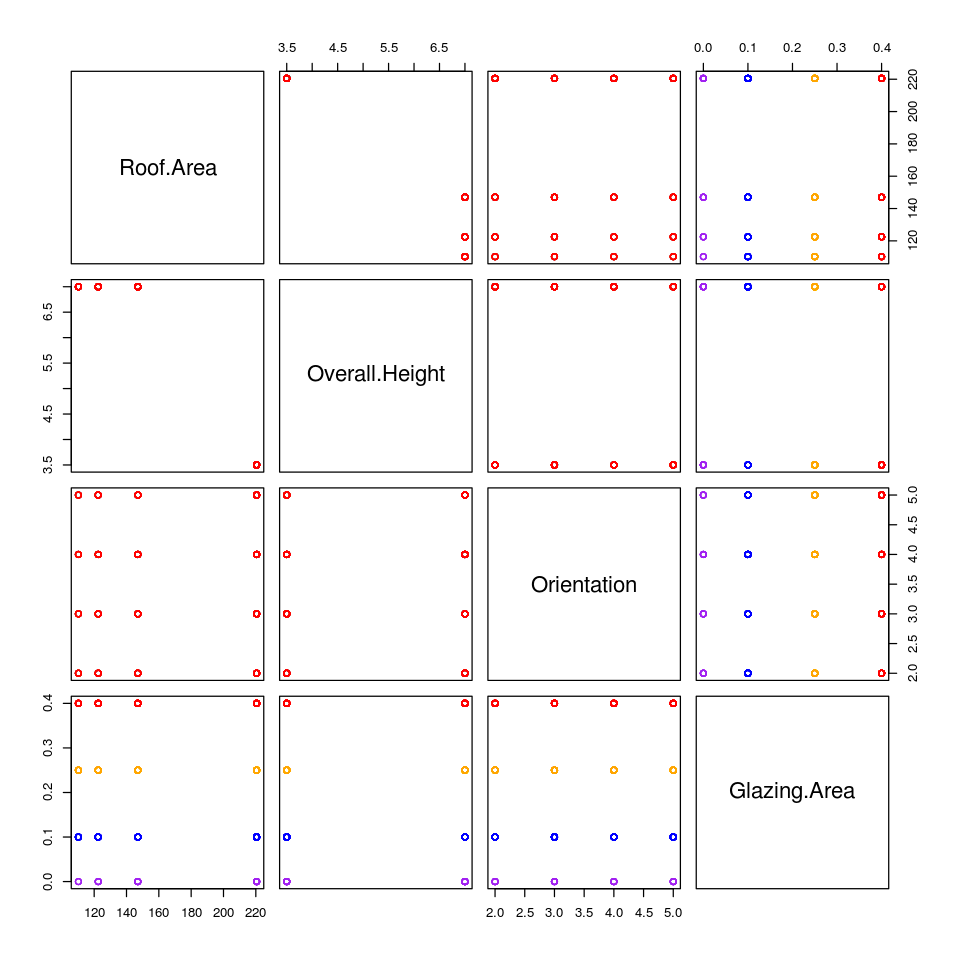

In [60]:
pairs(bldg.energy[,4:7], col=cols4)

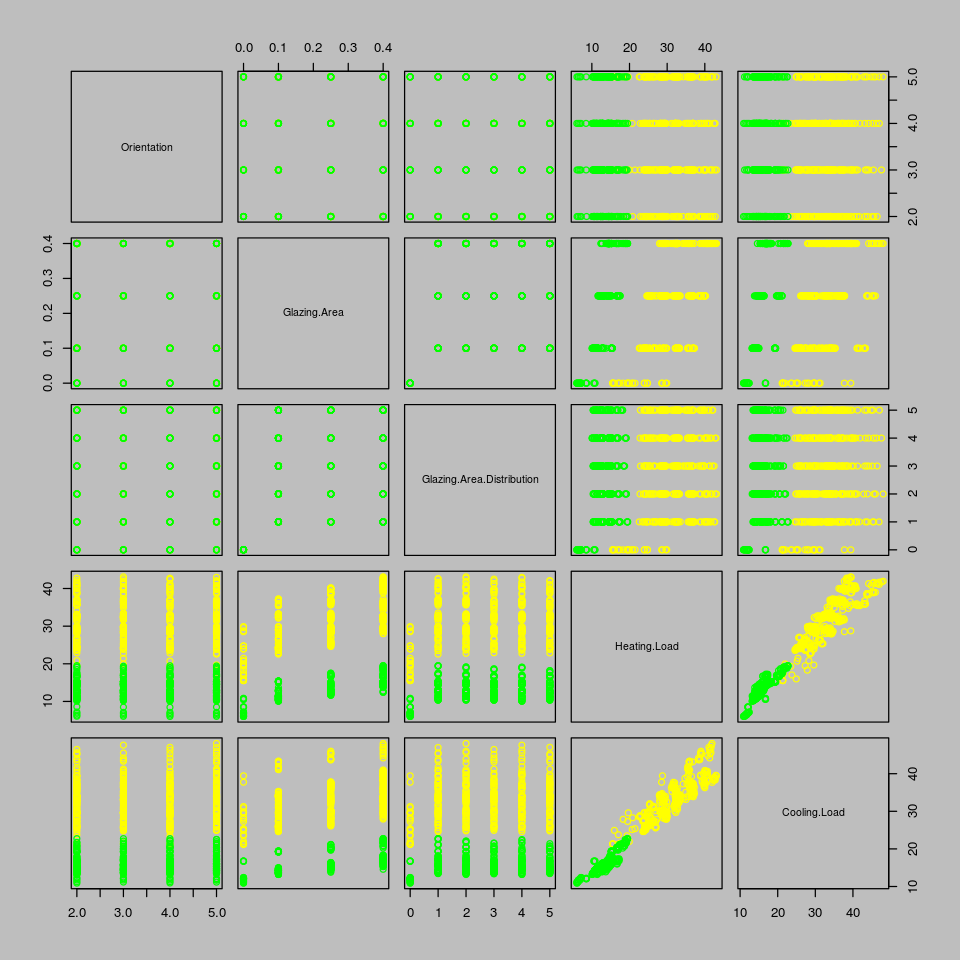

In [61]:
par(bg="gray")
pairs(bldg.energy[,6:10], col=cols2)

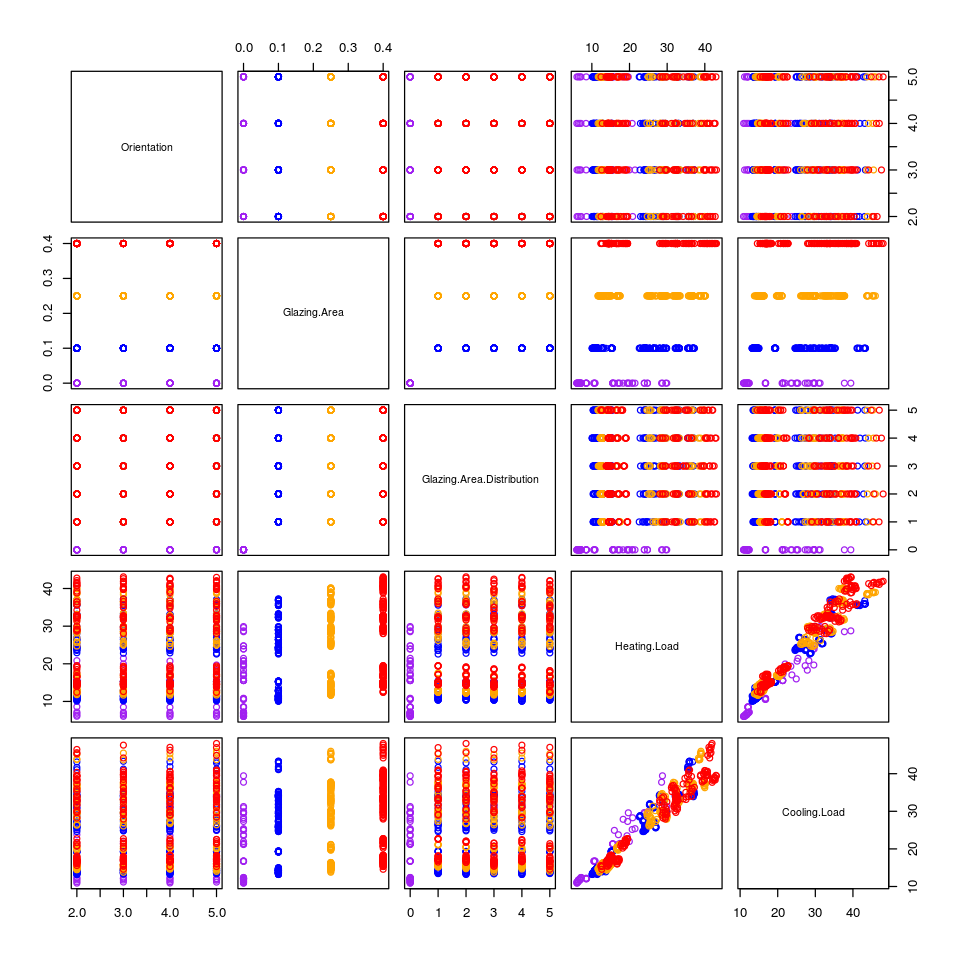

In [62]:
pairs(bldg.energy[,6:10], col=cols4)

In [63]:
## Correlation from table

In [64]:
cor(bldg.energy)

,Relative.Compactness,Surface.Area,Wall.Area,Roof.Area,Overall.Height,Orientation,Glazing.Area,Glazing.Area.Distribution,Heating.Load,Cooling.Load
Relative.Compactness,1.000000e+00,-9.919015e-01,-0.2037817,-8.688234e-01,0.8277473,0.000000000,7.617400e-20,0.00000000,0.622272179,0.63433907
Surface.Area,-9.919015e-01,1.000000e+00,0.1955016,8.807195e-01,-0.8581477,0.000000000,4.664140e-20,0.00000000,-0.658120227,-0.67299893
Wall.Area,-2.037817e-01,1.955016e-01,1.0000000,-2.923165e-01,0.2809757,0.000000000,0.000000e+00,0.00000000,0.455671157,0.42711700
Roof.Area,-8.688234e-01,8.807195e-01,-0.2923165,1.000000e+00,-0.9725122,0.000000000,-1.197187e-19,0.00000000,-0.861828253,-0.86254660
Overall.Height,8.277473e-01,-8.581477e-01,0.2809757,-9.725122e-01,1.0000000,0.000000000,0.000000e+00,0.00000000,0.889430674,0.89578517
Orientation,0.000000e+00,0.000000e+00,0.0000000,0.000000e+00,0.0000000,1.000000000,0.000000e+00,0.00000000,-0.002586534,0.01428960
Glazing.Area,7.617400e-20,4.664140e-20,0.0000000,-1.197187e-19,0.0000000,0.000000000,1.000000e+00,0.21296422,0.269840996,0.20750499
Glazing.Area.Distribution,0.000000e+00,0.000000e+00,0.0000000,0.000000e+00,0.0000000,0.000000000,2.129642e-01,1.00000000,0.087367594,0.05052512
Heating.Load,6.222722e-01,-6.581202e-01,0.4556712,-8.618283e-01,0.8894307,-0.002586534,2.698410e-01,0.08736759,1.000000000,0.97586181
Cooling.Load,6.343391e-01,-6.729989e-01,0.4271170,-8.625466e-01,0.8957852,0.014289598,2.075050e-01,0.05052512,0.975861813,1.00000000


In [65]:
 bldg.compact = bldg.energy[, c('Roof.Area',
                                'Overall.Height',
                                'Heating.Load')]

In [66]:
cor (bldg.compact)

,Roof.Area,Overall.Height,Heating.Load
Roof.Area,1.0000000,-0.9725122,-0.8618283
Overall.Height,-0.9725122,1.0000000,0.8894307
Heating.Load,-0.8618283,0.8894307,1.0000000


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


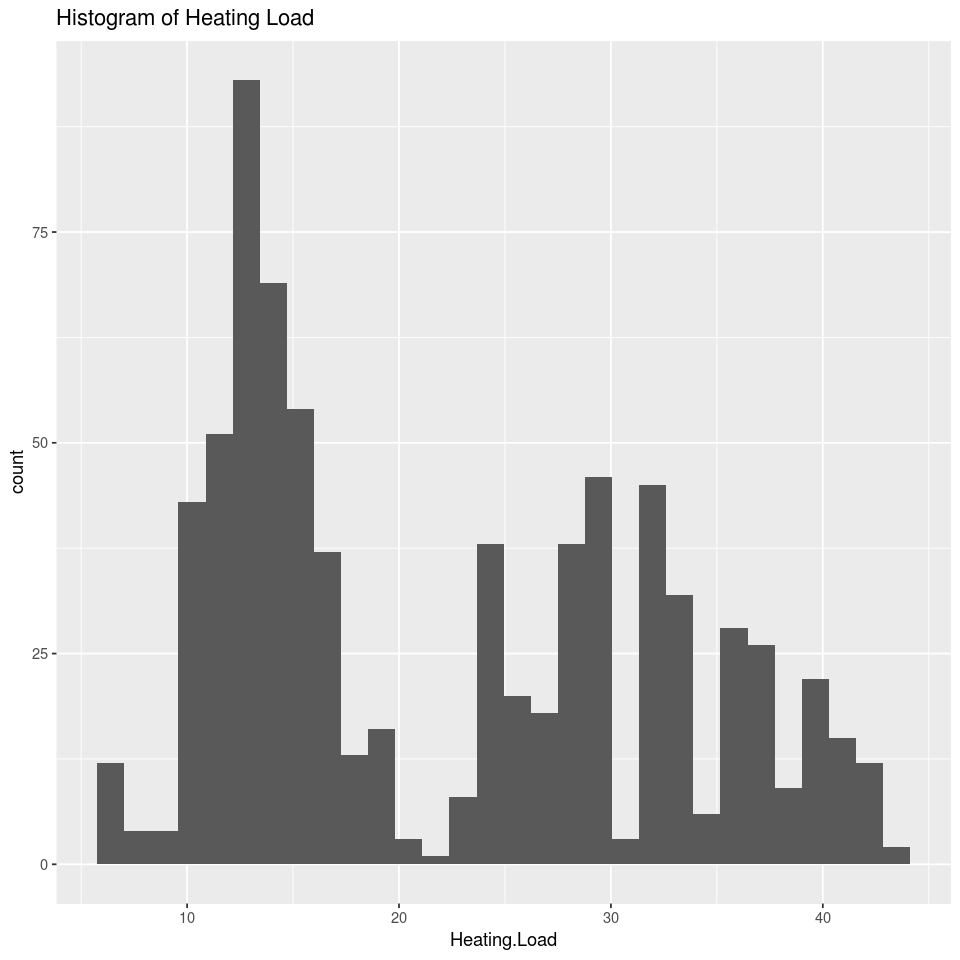

In [67]:
require(ggplot2)
ggplot(bldg.energy, aes(Heating.Load)) + ## Specify the data frame and columns. Note the + chain operator
     geom_histogram() + ## Fuction for the plot type 
     ggtitle('Histogram of Heating Load')

Loading required package: gridExtra


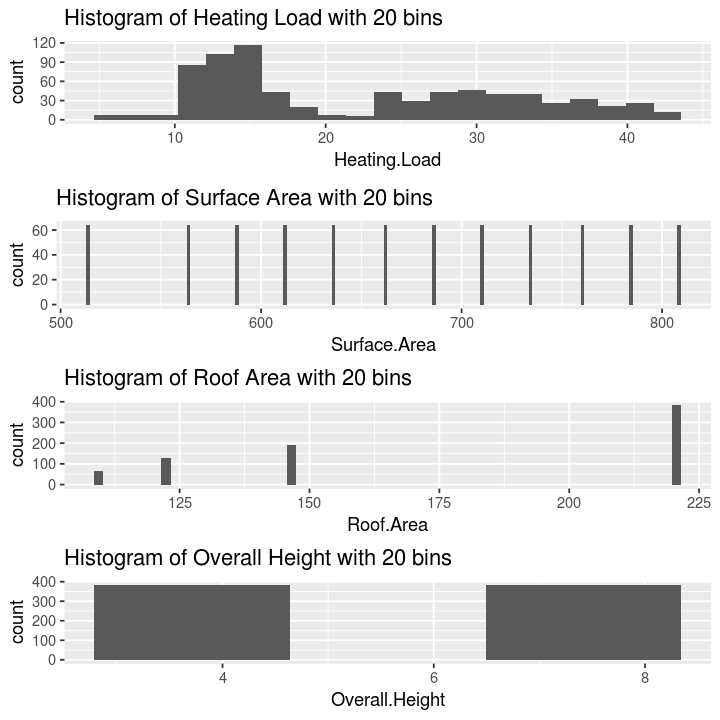

In [70]:
options(repr.plot.width=6, repr.plot.height=6)
bw1 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/20
bw2 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/50
require(gridExtra)
p1 = ggplot(bldg.energy, aes(Heating.Load)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Heating Load with 20 bins')
p2 = ggplot(bldg.energy, aes(Surface.Area)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Surface Area with 20 bins')
p3 = ggplot(bldg.energy, aes(Roof.Area)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Roof Area with 20 bins')
p4 = ggplot(bldg.energy, aes(Overall.Height)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Overall Height with 20 bins')
grid.arrange(p1, p2, p3, p4, nrow = 4)

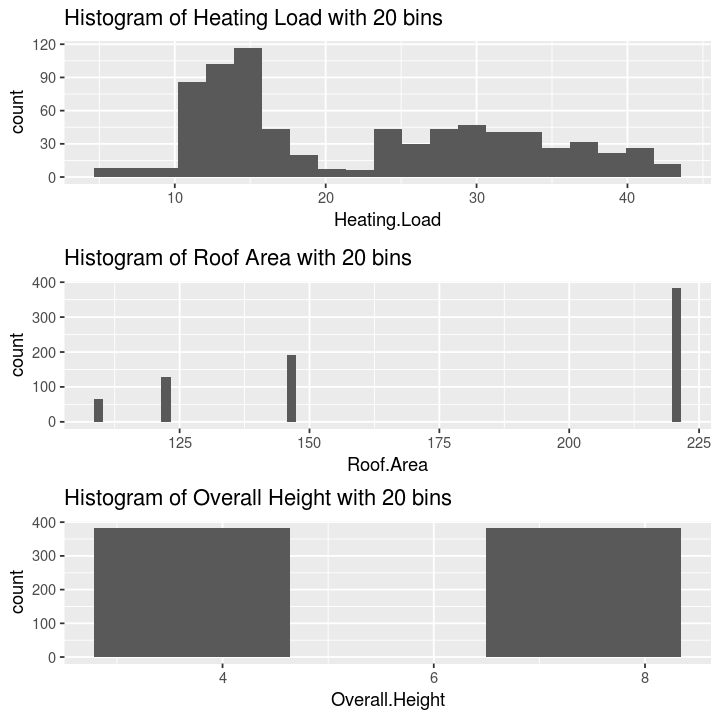

In [71]:
options(repr.plot.width=6, repr.plot.height=6)
bw1 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/20
bw2 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/50
require(gridExtra)
p1 = ggplot(bldg.energy, aes(Heating.Load)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Heating Load with 20 bins')
p3 = ggplot(bldg.energy, aes(Roof.Area)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Roof Area with 20 bins')
p4 = ggplot(bldg.energy, aes(Overall.Height)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Overall Height with 20 bins')
grid.arrange(p1, p3, p4, nrow = 3)

In [74]:
options(repr.plot.width=6, repr.plot.height=6)
bw1 = (max(bldg.energy$price) - min(auto.price$price))/20
bw2 = (max(auto.price$price) - min(auto.price$price))/50
require(gridExtra)
p1 = ggplot(bldg.energy, aes(Heating.Load)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Heating Load with 20 bins')
p3 = ggplot(bldg.energy, aes(Roof.Area)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Roof Area with 20 bins')
p4 = ggplot(bldg.energy, aes(Overall.Height)) + geom_histogram(binwidth = bw1) + 
        ggtitle('Histogram of Overall Height with 20 bins')
grid.arrange(p1, p3, p4, nrow = 3)

Warning message in max(bldg.energy$price):
“no non-missing arguments to max; returning -Inf”

ERROR: Error in eval(expr, envir, enclos): object 'auto.price' not found


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


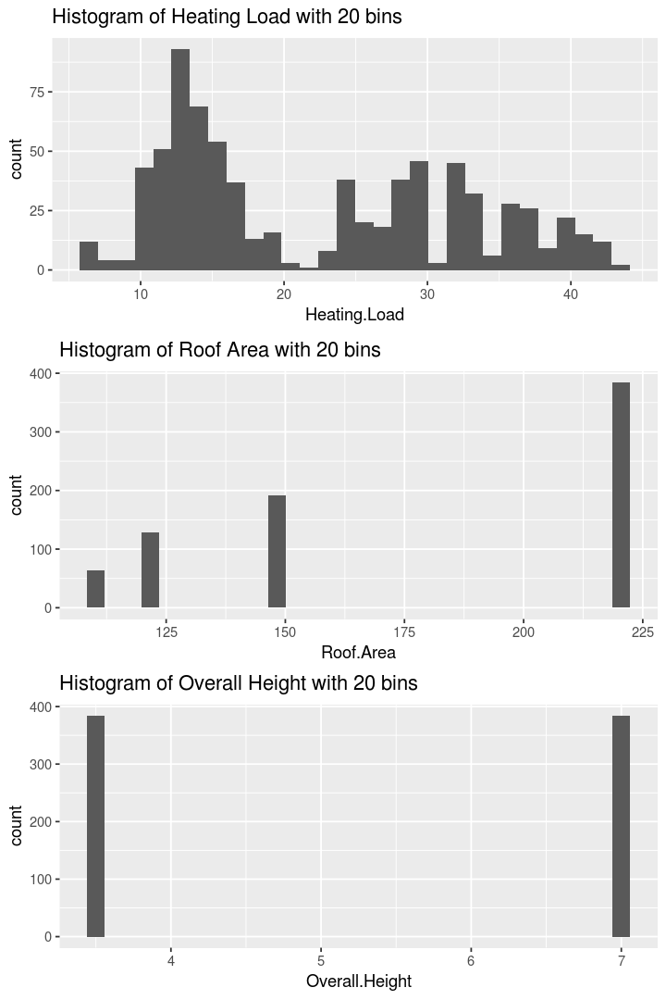

In [73]:
options(repr.plot.width=6, repr.plot.height=9)

require(gridExtra)
p1 = ggplot(bldg.energy, aes(Heating.Load)) + geom_histogram() + 
        ggtitle('Histogram of Heating Load with 20 bins')
p3 = ggplot(bldg.energy, aes(Roof.Area)) + geom_histogram() + 
        ggtitle('Histogram of Roof Area with 20 bins')
p4 = ggplot(bldg.energy, aes(Overall.Height)) + geom_histogram() + 
        ggtitle('Histogram of Overall Height with 20 bins')
grid.arrange(p1, p3, p4, nrow = 3)

In [ ]:
options(repr.plot.width=6, repr.plot.height=6)
library(ellipse)
R = cor(bldg.energy[, names(bldg.energy)], method = 'kendal')
print(R)
plotcorr(R, col = colorRampPalette(c("firebrick3", "white", "navy"))(10))

In [ ]:
options(repr.plot.width=6, repr.plot.height=6)
library(ellipse)
R = cor(bldg.energy[, names(bldg.energy)], method = 'pearson')
print(R)
plotcorr(R, col = colorRampPalette(c("firebrick3", "white", "navy"))(10))

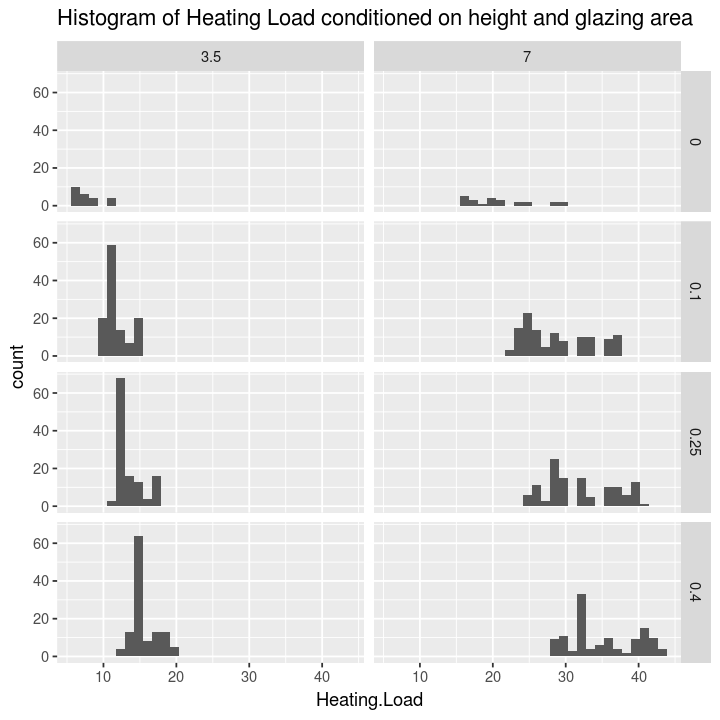

In [78]:
options(repr.plot.width=6, repr.plot.height=6)
bw1 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/30
ggplot(bldg.energy, aes(Heating.Load)) + 
        geom_histogram(binwidth = bw1) + 
        facet_grid(Glazing.Area ~ Overall.Height) +
        ggtitle('Histogram of Heating Load conditioned on height and glazing area')

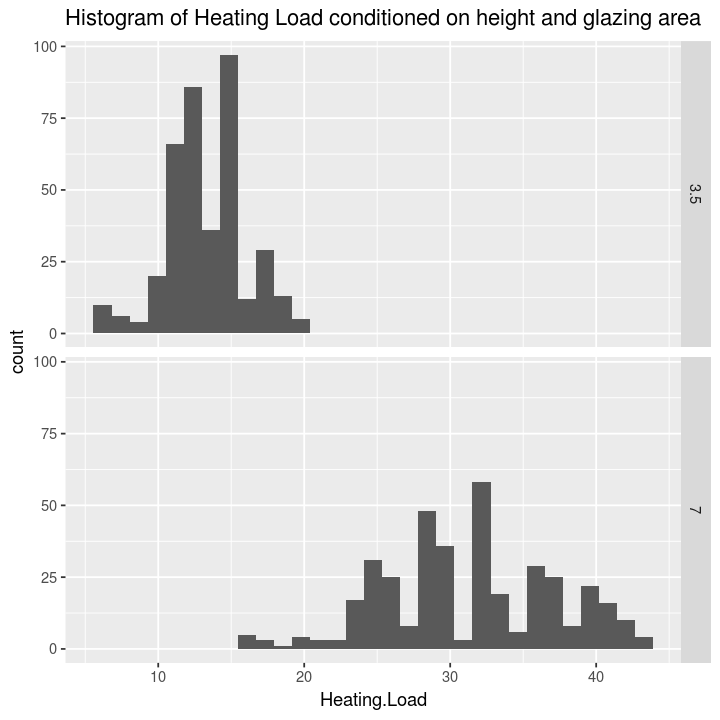

In [81]:
options(repr.plot.width=6, repr.plot.height=6)
bw1 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/30
ggplot(bldg.energy, aes(Heating.Load)) + 
        geom_histogram(binwidth = bw1) + 
        facet_grid(Overall.Height ~ .) +
        ggtitle('Histogram of Heating Load conditioned on height and glazing area')

In [76]:
options(repr.plot.width=6, repr.plot.height=6)
bw1 = (max(bldg.energy$Heating.Load) - min(bldg.energy$Heating.Load))/30
ggplot(bldg.energy, aes(Heating.Load)) + 
        geom_histogram(binwidth = bw1) + 
        facet_grid(Overall.Height) +
        ggtitle('Histogram of Heating Load conditioned on overall height and glazing area distribution')

ERROR: Error in facet_grid(Overall.Height): object 'Overall.Height' not found
